In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyproj import Proj, transform
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd

data = pd.read_csv("..\\datasets\\CBS_2021-2023_Full.csv")


D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\1925631996.py:10: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("..\\datasets\\CBS_2021-2023_Full.csv")


In [3]:
elevation = pd.read_csv("..\\src\\elevation_data.csv")

In [4]:
weather = pd.read_csv("..\\datasets\\CBS_2021-2023_Daily_Weather.csv")

In [5]:
# Dodanie kolumny wskazującej, czy rower został porzucony
data['was_dropped'] = data['end_station_name'].isna()

In [6]:
data.loc[data['start_station_name'] == 'National Harbor Carousel', 'elevation'] = 3
data.loc[data['end_station_name'] == 'National Harbor Carousel', 'elevation'] = 3

In [7]:
data

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,was_dropped,elevation
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,38.894600,-77.072305,member,False,NaN
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,38.960000,-77.020000,casual,True,NaN
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,38.920870,-77.031691,member,False,NaN
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,38.879477,-77.114563,member,False,NaN
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,38.931991,-77.032956,member,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693992,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,38.804718,-77.043363,member,False,NaN
10693993,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,38.890461,-76.988355,member,False,NaN
10693994,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,38.896104,-77.049882,casual,False,NaN
10693995,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,38.909394,-77.048728,casual,False,NaN


In [8]:
data.isnull().sum()

ride_id                      0
rideable_type                0
started_at                   0
ended_at                     0
start_station_name      742776
start_station_id        742776
end_station_name        811282
end_station_id          811282
start_lat                    2
start_lng                    2
end_lat                  16765
end_lng                  16765
member_casual                0
was_dropped                  0
elevation             10683941
dtype: int64

In [9]:
data["rideable_type"].value_counts()

rideable_type
classic_bike     7710372
electric_bike    2444151
docked_bike       539474
Name: count, dtype: int64

In [10]:
data[data["was_dropped"] == True]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,was_dropped,elevation
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,38.96,-77.02,casual,True,NaN
7,78894BDABD9F21DD,electric_bike,2021-01-01 00:20:40,2021-01-01 00:35:36,Columbia Rd & Georgia Ave NW,31115.0,NaN,NaN,38.928081,-77.023768,38.90,-77.02,casual,True,NaN
17,3F8AFD9540FF8EDB,electric_bike,2021-01-01 00:26:41,2021-01-01 00:30:09,14th & Harvard St NW,31105.0,NaN,NaN,38.926715,-77.032145,38.93,-77.04,member,True,NaN
20,997E8E08C493F034,electric_bike,2021-01-01 00:27:18,2021-01-01 00:34:30,NaN,NaN,NaN,NaN,38.990000,-77.030000,38.99,-77.03,member,True,NaN
21,F1F87FA560990FC7,electric_bike,2021-01-01 00:28:39,2021-01-01 00:41:31,Connecticut Ave & Newark St NW / Cleveland Park,31305.0,NaN,NaN,38.934253,-77.058010,38.92,-77.07,member,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693970,C23F1DB65A85FB04,electric_bike,2023-12-31 23:47:46,2023-12-31 23:59:18,14th & L St NW,31283.0,NaN,NaN,38.903728,-77.031661,38.90,-77.02,member,True,NaN
10693977,EA4524CC5F528237,electric_bike,2023-12-31 23:51:14,2023-12-31 23:59:49,NaN,NaN,NaN,NaN,38.910000,-77.020000,38.92,-77.04,member,True,NaN
10693985,52DD927885B2A4E9,electric_bike,2023-12-31 23:54:07,2024-01-01 00:01:39,Fort Totten Metro,31515.0,NaN,NaN,38.952364,-77.002654,38.96,-76.98,member,True,NaN
10693988,5982B1B6C2B49DA9,electric_bike,2023-12-31 23:56:22,2023-12-31 23:59:14,14th & Irving St NW,31124.0,NaN,NaN,38.928623,-77.032059,38.93,-77.04,member,True,NaN


In [11]:
# Filter rows where end_lat and end_lng have more than 2 decimal places, and end_station_name is NaN
data_filtered = data[
    (data['end_station_name'].isna()) & 
    (data['end_lat'].apply(lambda x: len(str(x).split('.')[1]) > 2 if '.' in str(x) else False)) & 
    (data['end_lng'].apply(lambda x: len(str(x).split('.')[1]) > 2 if '.' in str(x) else False))
]

# Display the end_lat, end_lng, and end_station_name columns of the filtered rows
data_filtered[['end_lat', 'end_lng', 'end_station_name']]


,end_lat,end_lng,end_station_name


In [12]:
elevation

,station_name,latitude,longitude,elevation,elevation_label
0,Maine Ave & 9th St SW,38.880440,-77.025236,3.0,low
1,10th & U St NW,38.917193,-77.025894,31.0,medium
2,17th & Corcoran St NW,38.912138,-77.038568,29.0,medium
3,Wilson Blvd. & N. Vermont St.,38.879477,-77.114563,82.0,high
4,11th & Park Rd NW,38.931322,-77.028247,60.0,medium
...,...,...,...,...,...
854,Old Meadow Rd & Cathy Ln,38.916908,-77.213879,121.0,high
855,Route 29 & Circle Woods Dr,38.869114,-77.271538,102.0,high
856,Prosperity Ave & Avenir Pl,38.881436,-77.230377,119.0,high
857,Kingsbridge Dr & Draper Dr,38.868545,-77.282083,98.0,high


In [13]:
# Step 1: Create a dictionary to map 'station_name' to 'elevation' from the 'elevation' DataFrame
elevation_dict = dict(zip(elevation['station_name'], elevation['elevation']))

# Step 2: Use the map function to assign elevations to both 'start_station_name' and 'end_station_name' in one go

# Map start_elevation using the elevation_dict
data['start_elevation'] = data['start_station_name'].map(elevation_dict)

# Map end_elevation using the same elevation_dict
data['end_elevation'] = data['end_station_name'].map(elevation_dict)

# Print a sample to check
print(data[['start_station_name', 'start_elevation', 'end_station_name', 'end_elevation']].head())

              start_station_name  start_elevation  \
0          Maine Ave & 9th St SW              3.0   
1                 10th & U St NW             31.0   
2          17th & Corcoran St NW             29.0   
3  Wilson Blvd. & N. Vermont St.             82.0   
4              11th & Park Rd NW             60.0   

                           end_station_name  end_elevation  
0  Rosslyn Metro / Wilson Blvd & Ft Myer Dr           51.0  
1                                       NaN           61.0  
2                      14th & Belmont St NW           51.0  
3             Wilson Blvd. & N. Vermont St.           82.0  
4                       14th & Newton St NW           62.0  


In [14]:
# Calculate the elevation change or inclination
data['elevation_change'] = data['start_elevation'] - data['end_elevation']
print(data[['start_station_name', 'start_elevation', 'end_station_name', 'end_elevation', 'elevation_change']].head())

              start_station_name  start_elevation  \
0          Maine Ave & 9th St SW              3.0   
1                 10th & U St NW             31.0   
2          17th & Corcoran St NW             29.0   
3  Wilson Blvd. & N. Vermont St.             82.0   
4              11th & Park Rd NW             60.0   

                           end_station_name  end_elevation  elevation_change  
0  Rosslyn Metro / Wilson Blvd & Ft Myer Dr           51.0             -48.0  
1                                       NaN           61.0             -30.0  
2                      14th & Belmont St NW           51.0             -22.0  
3             Wilson Blvd. & N. Vermont St.           82.0               0.0  
4                       14th & Newton St NW           62.0              -2.0  


In [15]:
data

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,was_dropped,elevation,start_elevation,end_elevation,elevation_change
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,38.894600,-77.072305,member,False,NaN,3.0,51.0,-48.0
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,38.960000,-77.020000,casual,True,NaN,31.0,61.0,-30.0
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,38.920870,-77.031691,member,False,NaN,29.0,51.0,-22.0
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,38.879477,-77.114563,member,False,NaN,82.0,82.0,0.0
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,38.931991,-77.032956,member,False,NaN,60.0,62.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693992,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,38.804718,-77.043363,member,False,NaN,11.0,16.0,-5.0
10693993,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,38.890461,-76.988355,member,False,NaN,21.0,28.0,-7.0
10693994,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,38.896104,-77.049882,casual,False,NaN,20.0,23.0,-3.0
10693995,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,38.909394,-77.048728,casual,False,NaN,20.0,20.0,0.0


In [16]:
# Calculate the percentage of dropped bikes (missing end_station_name)
dropped_bikes_percentage = (data["end_station_name"].isna().sum() / len(data)) * 100
print(f"Percentage of dropped bikes: {dropped_bikes_percentage:.2f}%")

Percentage of dropped bikes: 7.59%


In [17]:
data[(data["end_station_name"].isna()) & (data["rideable_type"] == 'classic_bike')]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,was_dropped,elevation,start_elevation,end_elevation,elevation_change
323,19A6B2FB77AB963C,classic_bike,2021-01-01 09:30:20,2021-01-01 11:21:33,Tenleytown / Wisconsin Ave & Albemarle St NW,31303.0,NaN,NaN,38.947607,-77.079382,NaN,NaN,casual,True,NaN,122.0,61.0,61.0
561,38D717869E1FCE4D,classic_bike,2021-01-01 12:57:44,2021-01-01 16:19:10,Lincoln Memorial,31258.0,NaN,NaN,38.888255,-77.049436,NaN,NaN,member,True,NaN,12.0,61.0,-49.0
671,A065F84C99F27AF4,classic_bike,2021-01-01 14:20:37,2021-01-01 14:47:40,Arlington Blvd & N Queen St,31051.0,NaN,NaN,38.889365,-77.077294,38.91,-77.07,member,True,NaN,47.0,61.0,-14.0
1648,FCB1785D2FEDEE3C,classic_bike,2021-01-02 11:08:22,2021-01-02 11:33:36,Roosevelt Island,31062.0,NaN,NaN,38.896553,-77.067140,38.86,-77.05,casual,True,NaN,15.0,61.0,-46.0
1649,9FA222683B8CA273,classic_bike,2021-01-02 11:08:23,2021-01-02 11:33:36,Roosevelt Island,31062.0,NaN,NaN,38.896553,-77.067140,38.86,-77.05,member,True,NaN,15.0,61.0,-46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10691132,3F8532668AA7F819,classic_bike,2023-12-31 15:52:03,2024-01-01 16:51:59,1st & Q St SW,31676.0,NaN,NaN,38.870824,-77.011915,NaN,NaN,casual,True,NaN,8.0,61.0,-53.0
10691183,AB96A405EC88BC37,classic_bike,2023-12-31 15:57:04,2024-01-01 16:56:58,1st & N St SE,31209.0,NaN,NaN,38.875023,-77.005754,NaN,NaN,member,True,NaN,6.0,61.0,-55.0
10691725,EC32D807C14F833B,classic_bike,2023-12-31 16:47:09,2024-01-01 17:47:02,Alabama Ave & Stanton Rd SE / Shops at Park Vi...,31813.0,NaN,NaN,38.846270,-76.981850,NaN,NaN,casual,True,NaN,54.0,61.0,-7.0
10693231,E88253B06CA516EA,classic_bike,2023-12-31 20:33:50,2024-01-01 21:33:36,22nd St & Constitution Ave NW,31292.0,NaN,NaN,38.892441,-77.048947,NaN,NaN,casual,True,NaN,11.0,61.0,-50.0


Text(0.5, 1.0, 'Dropped Bike vs Bike Type')

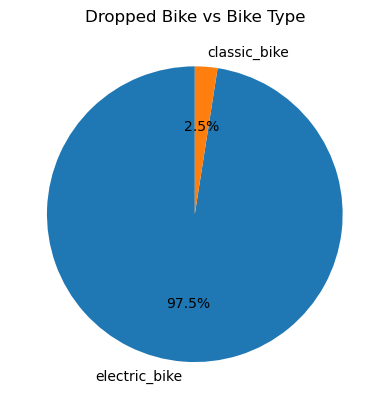

In [18]:
filtered_data = data[(data["end_station_name"].isna()) & (data["rideable_type"].isin(['electric_bike', 'classic_bike']))]
label = (filtered_data['rideable_type'].value_counts()).index
plt.figure()
plt.pie(filtered_data['rideable_type'].value_counts(), labels = label, autopct='%1.1f%%', startangle=90)
plt.title('Dropped Bike vs Bike Type')

In [19]:
# Define the classify_elevation function
def classify_elevation(elevation):
    if elevation < 20:
        return 'low'
    elif elevation <= 70:
        return 'medium'
    else:
        return 'high'

# Apply classify_elevation to both start_elevation and end_elevation
data['start_elevation_label'] = data['start_elevation'].apply(classify_elevation)
data['end_elevation_label'] = data['end_elevation'].apply(classify_elevation)

# Print a sample to check the new labels
print(data[['start_elevation', 'start_elevation_label', 'end_elevation', 'end_elevation_label']].head())

   start_elevation start_elevation_label  end_elevation end_elevation_label
0              3.0                   low           51.0              medium
1             31.0                medium           61.0              medium
2             29.0                medium           51.0              medium
3             82.0                  high           82.0                high
4             60.0                medium           62.0              medium


In [20]:
data['started_at'] = pd.to_datetime(data['started_at'])  # change to datetime format
data['ended_at'] = pd.to_datetime(data['ended_at'])
data['trip_duration'] = data['ended_at'] - data['started_at']
data['trip_duration_minutes'] = (data['trip_duration'].dt.total_seconds() / 60).round(0)

In [21]:
data = data[data['trip_duration_minutes'] >= 0]

Impact of elevation change on trip duration 

In [22]:
electric = data[(data["rideable_type"] == "electric_bike") & (data["was_dropped"] == True) & (data['trip_duration_minutes'] > 5) & (data['start_station_name'] != data['end_station_name'])]

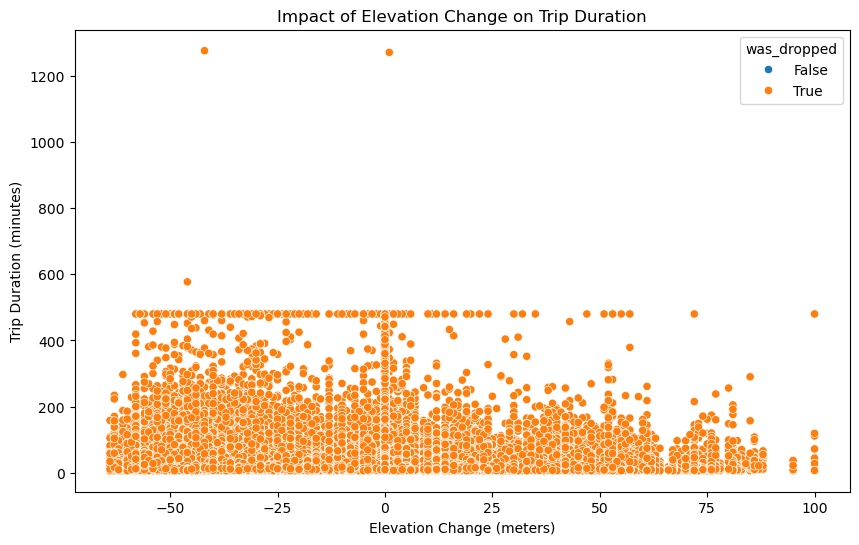

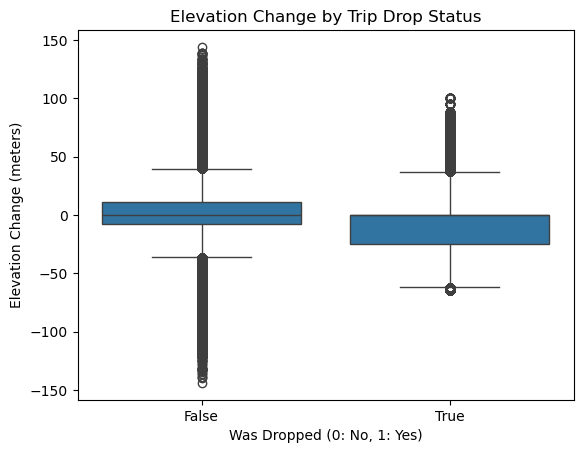

In [23]:
electric = data[(data["rideable_type"] == "electric_bike") & (data["was_dropped"] == True) & (data['trip_duration_minutes'] > 5) & (data['start_station_name'] != data['end_station_name'])]

# Plotting the relationship between elevation change and trip duration
plt.figure(figsize=(10, 6))
sns.scatterplot(x=electric['elevation_change'], y=data['trip_duration_minutes'], hue=data['was_dropped'])
plt.title('Impact of Elevation Change on Trip Duration')
plt.xlabel('Elevation Change (meters)')
plt.ylabel('Trip Duration (minutes)')
plt.show()

# Analyzing the likelihood of a trip being dropped based on elevation change
sns.boxplot(x=data['was_dropped'], y=data['elevation_change'])
plt.title('Elevation Change by Trip Drop Status')
plt.xlabel('Was Dropped (0: No, 1: Yes)')
plt.ylabel('Elevation Change (meters)')
plt.show()


In [24]:
electric = data[(data["rideable_type"] == "electric_bike") & (data["was_dropped"] == True) & (data['trip_duration_minutes'] > 5) & (data['start_station_name'] != data['end_station_name'])]

downhill_dropped = electric[electric["elevation_change"] > 5]
flat_dropped = electric[(electric["elevation_change"] >= -5) & (electric["elevation_change"] <= 5) ]
uphill_dropped = electric[electric["elevation_change"] < - 5]



percentage_downhill_dropped = (len(downhill_dropped) / len(electric)) * 100
percentage_uphill_dropped = (len(uphill_dropped) / len(electric)) * 100
percentage_flat_dropped = (len(flat_dropped) / len(electric)) * 100


print(f"Percentage of dropped e-bike during downhill rides: {percentage_downhill_dropped:.2f}%")
print(f"Percentage of dropped e-bike trips during uphill rides: {percentage_uphill_dropped:.2f}%")
print(f"Percentage of dropped e-bike on flat route: {percentage_flat_dropped:.2f}%")

Percentage of dropped e-bike during downhill rides: 6.83%
Percentage of dropped e-bike trips during uphill rides: 31.94%
Percentage of dropped e-bike on flat route: 61.22%


In [25]:
def categorize_elevation(change):
    if change < -5:
        return "uphill"
    elif change > 5:
        return "downhill"
    else:
        return "flat"

electric["elevation_category"] = electric["elevation_change"].apply(categorize_elevation)


D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\4176778325.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  electric["elevation_category"] = electric["elevation_change"].apply(categorize_elevation)


In [26]:
# Filter dropped e-bikes for casual and member users
casual_dropped = electric[electric["member_casual"] == "casual"]
member_dropped = electric[electric["member_casual"] == "member"]

In [27]:
# Count drops by elevation category for casual and member users
casual_counts = casual_dropped["elevation_category"].value_counts(normalize=True) * 100
member_counts = member_dropped["elevation_category"].value_counts(normalize=True) * 100

print("Casual Riders - Drop Rates by Elevation Category:")
print(casual_counts)

print("\nMember Riders - Drop Rates by Elevation Category:")
print(member_counts)


Casual Riders - Drop Rates by Elevation Category:
elevation_category
flat        58.738835
uphill      32.749599
downhill     8.511566
Name: proportion, dtype: float64

Member Riders - Drop Rates by Elevation Category:
elevation_category
flat        62.942903
uphill      31.381585
downhill     5.675512
Name: proportion, dtype: float64


E-bike Drop Rates by Elevation Category:
elevation_category
downhill    100.0
flat        100.0
uphill      100.0
Name: was_dropped, dtype: float64


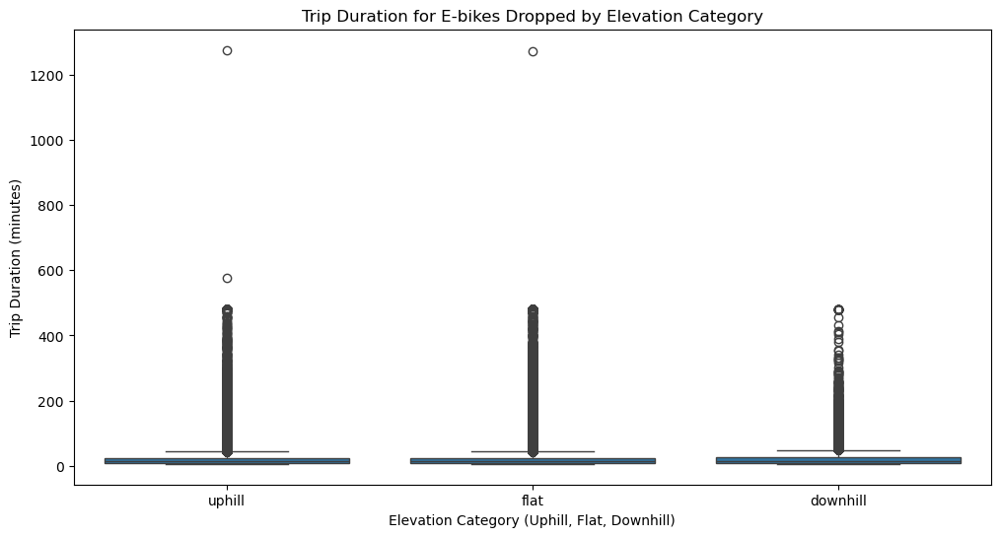

D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\2321092755.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  electric['trip_duration_category'] = pd.cut(electric['trip_duration_minutes'],
D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\2321092755.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  trip_duration_drop_rate = electric.groupby('trip_duration_category')['was_dropped'].mean() * 100


E-bike Drop Rates by Trip Duration Category:
trip_duration_category
Short        100.0
Medium       100.0
Long         100.0
Very Long    100.0
Name: was_dropped, dtype: float64


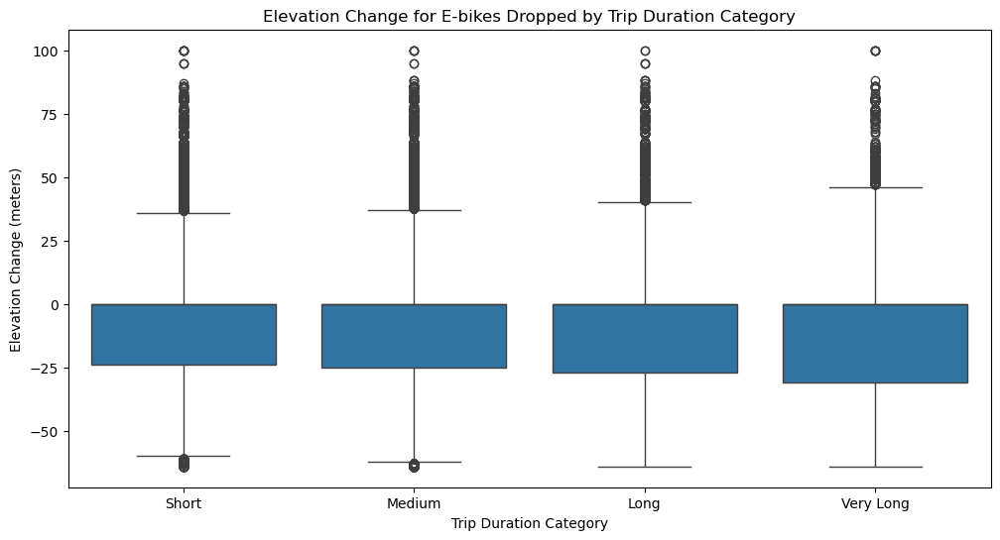

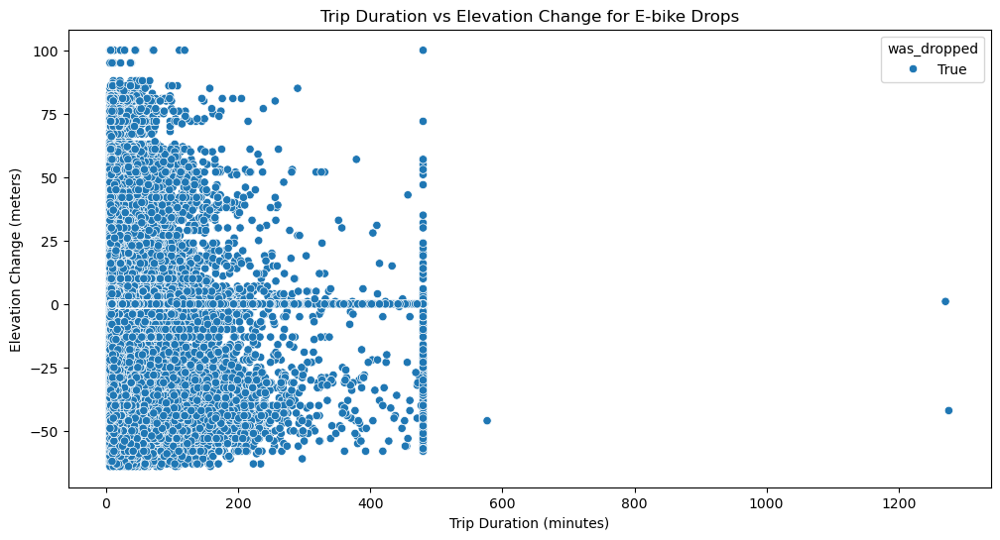

In [28]:
elevation_drop_rate = electric.groupby('elevation_category')['was_dropped'].mean() * 100
print("E-bike Drop Rates by Elevation Category:")
print(elevation_drop_rate)

# Plot the distribution of trip duration for e-bikes that were dropped, by elevation category
plt.figure(figsize=(12, 6))
sns.boxplot(x='elevation_category', y='trip_duration_minutes', data=electric)
plt.title('Trip Duration for E-bikes Dropped by Elevation Category')
plt.xlabel('Elevation Category (Uphill, Flat, Downhill)')
plt.ylabel('Trip Duration (minutes)')
plt.show()

# 2. **Analyzing E-bike Drop Rates by Trip Duration**
# Create a categorical variable based on trip duration: Short, Medium, Long
electric['trip_duration_category'] = pd.cut(electric['trip_duration_minutes'], 
                                             bins=[0, 10, 30, 60, float('inf')],
                                             labels=['Short', 'Medium', 'Long', 'Very Long'])

# Drop rates by trip duration category
trip_duration_drop_rate = electric.groupby('trip_duration_category')['was_dropped'].mean() * 100
print("E-bike Drop Rates by Trip Duration Category:")
print(trip_duration_drop_rate)

# Plot the relationship between trip duration and drop status for e-bikes
plt.figure(figsize=(12, 6))
sns.boxplot(x='trip_duration_category', y='elevation_change', data=electric)
plt.title('Elevation Change for E-bikes Dropped by Trip Duration Category')
plt.xlabel('Trip Duration Category')
plt.ylabel('Elevation Change (meters)')
plt.show()

# 3. **Correlation between Trip Duration and Elevation Change for E-bike Drops**
plt.figure(figsize=(12, 6))
sns.scatterplot(x=electric['trip_duration_minutes'], y=electric['elevation_change'], hue=electric['was_dropped'])
plt.title('Trip Duration vs Elevation Change for E-bike Drops')
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Elevation Change (meters)')
plt.show()

Flat routes are the most common for e-bike drops, for both casual and member riders (around 60-65%). This could indicate that factors other than elevation (like availability of docking stations, user habits, or trip duration) are playing a role in drop-off behavior.

In [29]:
weather

,Casual,Date,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h)
0,371,2021-01-01,590,961,-0.9,2.3,63,10.6
1,2874,2021-01-02,2844,5718,4.8,7.6,61,19.1
2,495,2021-01-03,1133,1628,0.9,3.9,63,13.0
3,907,2021-01-04,2074,2981,1.0,4.1,3,13.3
4,1057,2021-01-05,2004,3061,1.4,4.0,51,9.2
...,...,...,...,...,...,...,...,...
1090,646,2023-12-27,1934,2580,-8.6,-4.3,71,10.1
1091,3099,2023-12-28,4819,7918,-7.0,-2.5,0,12.8
1092,3491,2023-12-29,5168,8659,-7.8,-3.9,1,9.5
1093,3097,2023-12-30,4497,7594,-7.3,-2.9,1,13.8


                                apparent_temperature_mean (°C)  \
apparent_temperature_mean (°C)                        1.000000   
temperature_2m_mean (°C)                              0.988286   
windspeed_10m_max (km/h)                             -0.118050   
Total_rides                                           0.582780   

                                temperature_2m_mean (°C)  \
apparent_temperature_mean (°C)                  0.988286   
temperature_2m_mean (°C)                        1.000000   
windspeed_10m_max (km/h)                       -0.025445   
Total_rides                                     0.631886   

                                windspeed_10m_max (km/h)  Total_rides  
apparent_temperature_mean (°C)                 -0.118050     0.582780  
temperature_2m_mean (°C)                       -0.025445     0.631886  
windspeed_10m_max (km/h)                        1.000000    -0.069939  
Total_rides                                    -0.069939     1.000000  


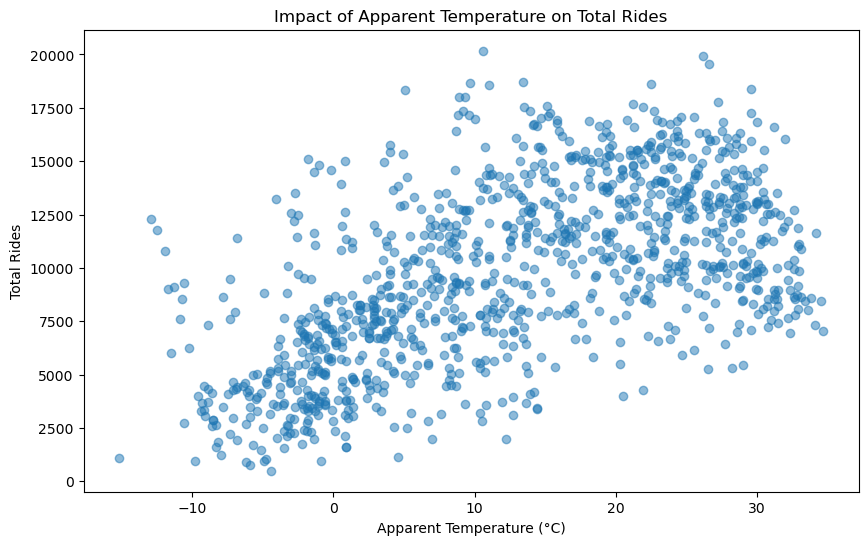

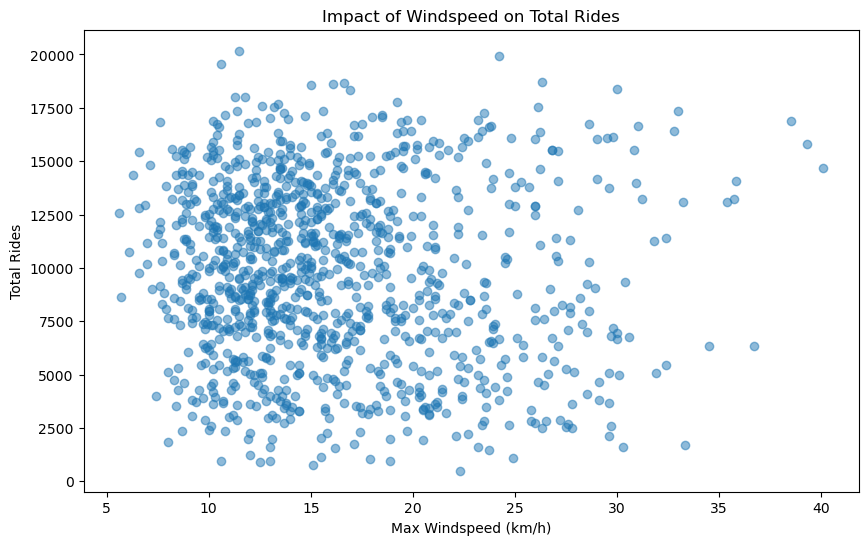

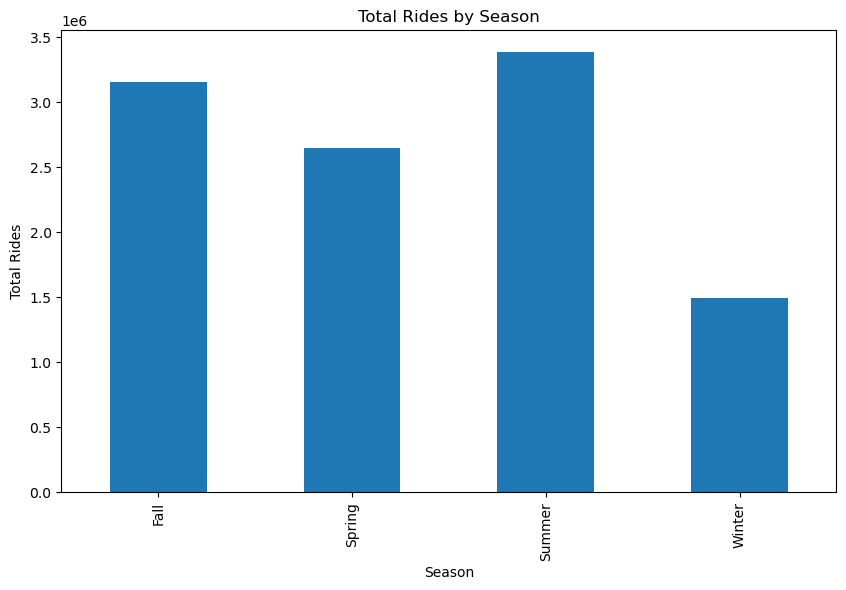

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'df' with the data
# Convert 'Date' to datetime format
weather['Date'] = pd.to_datetime(weather['Date'])

# Add columns for year, month, and season
weather['year'] = weather['Date'].dt.year
weather['month'] = weather['Date'].dt.month
weather['season'] = weather['month'].apply(lambda x: 'Winter' if x in [12, 1, 2] else ('Spring' if x in [3, 4, 5] else ('Summer' if x in [6, 7, 8] else 'Fall')))

# Calculate correlation matrix for numerical columns
correlation = weather[['apparent_temperature_mean (°C)', 'temperature_2m_mean (°C)', 'windspeed_10m_max (km/h)', 'Total_rides']].corr()
print(correlation)

# Visualize the impact of temperature on rides
plt.figure(figsize=(10, 6))
plt.scatter(weather['apparent_temperature_mean (°C)'], weather['Total_rides'], alpha=0.5)
plt.title('Impact of Apparent Temperature on Total Rides')
plt.xlabel('Apparent Temperature (°C)')
plt.ylabel('Total Rides')
plt.show()

# Visualize the impact of windspeed on rides
plt.figure(figsize=(10, 6))
plt.scatter(weather['windspeed_10m_max (km/h)'], weather['Total_rides'], alpha=0.5)
plt.title('Impact of Windspeed on Total Rides')
plt.xlabel('Max Windspeed (km/h)')
plt.ylabel('Total Rides')
plt.show()

# Compare rides by season
seasonal_rides = weather.groupby('season')['Total_rides'].sum()
seasonal_rides.plot(kind='bar', figsize=(10, 6))
plt.title('Total Rides by Season')
plt.xlabel('Season')
plt.ylabel('Total Rides')
plt.show()


In [31]:
data['Date'] = data['started_at'].dt.date

# Check the data
print(data[['started_at', 'Date']].head())

           started_at        Date
0 2021-01-01 00:08:33  2021-01-01
1 2021-01-01 00:13:43  2021-01-01
2 2021-01-01 00:14:32  2021-01-01
3 2021-01-01 00:15:45  2021-01-01
4 2021-01-01 00:17:46  2021-01-01


D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\3328134488.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date'] = data['started_at'].dt.date


In [38]:
def reduce_memory_usage(df):
    for col in df.select_dtypes(include=['int64']).columns:
        df[col] = pd.to_numeric(df[col], downcast='integer')
    for col in df.select_dtypes(include=['float64']).columns:
        df[col] = pd.to_numeric(df[col], downcast='float')
    return df

# Apply to both DataFrames
data = reduce_memory_usage(data)
weather = reduce_memory_usage(weather)

MemoryError: Unable to allocate 734. MiB for an array with shape (9, 10693415) and data type float64

In [ ]:
weather = weather[['Date', 'temperature_2m_mean (°C)', 'weathercode (wmo code)']]  
bike_weather = pd.merge(data, weather, on='Date', how='inner')


MemoryError: Unable to allocate 81.6 MiB for an array with shape (10693415,) and data type int64

In [36]:
import pandas as pd

# Ensure Date is in datetime format
data['Date'] = pd.to_datetime(data['Date'])
weather['Date'] = pd.to_datetime(weather['Date'])

# Merge datasets on 'Date'
bike_weather = pd.merge(data, weather, on='Date', how='inner')

# Check merged data
print(bike_weather.head())


D:\Users\Olunia\AppData\Local\Temp\ipykernel_3024\372675884.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date'] = pd.to_datetime(data['Date'])


MemoryError: Unable to allocate 734. MiB for an array with shape (9, 10693415) and data type object

In [39]:
bike_weather.columns

NameError: name 'bike_weather' is not defined

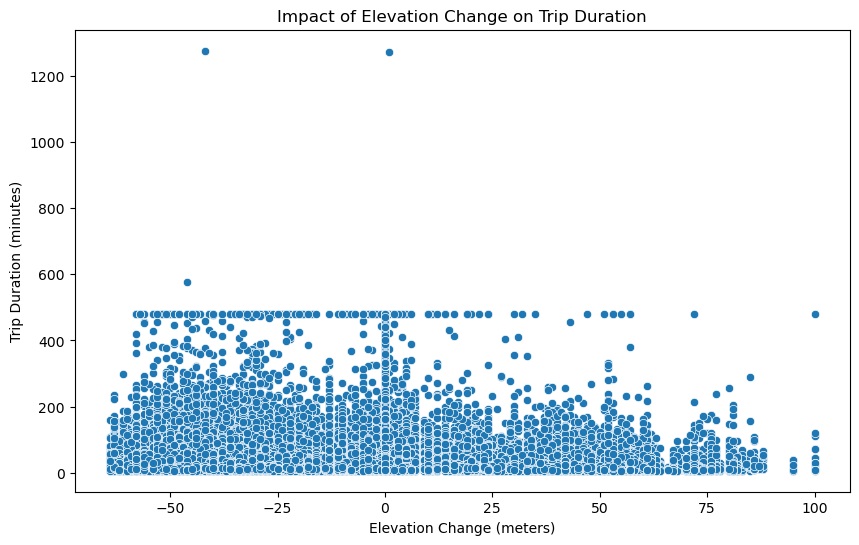

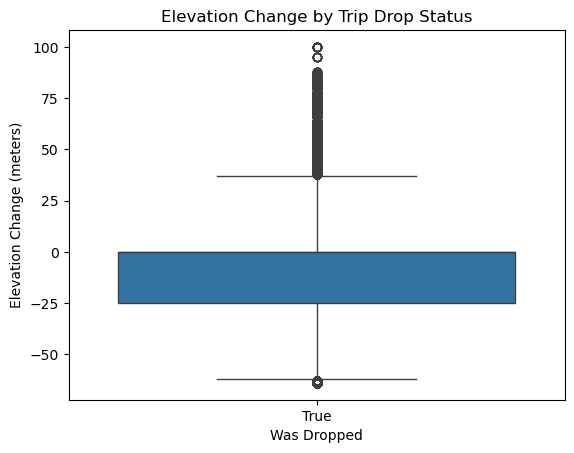

In [ ]:
bike_weather_electric = bike_weather[(bike_weather['rideable_type'] == 'electric_bike')  & (bike_weather["was_dropped"] == True) & (bike_weather['trip_duration_minutes'] > 5) & (bike_weather['start_station_name'] != bike_weather['end_station_name'])]

# Plotting the relationship between elevation change and trip duration
plt.figure(figsize=(10, 6))
sns.scatterplot(x=bike_weather_electric['elevation_change'], y=bike_weather_electric['trip_duration_minutes'])
plt.title('Impact of Elevation Change on Trip Duration')
plt.xlabel('Elevation Change (meters)')
plt.ylabel('Trip Duration (minutes)')
plt.show()

# Analyzing the likelihood of a trip being dropped based on elevation change
sns.boxplot(x=bike_weather_electric['was_dropped'], y=bike_weather_electric['elevation_change'])
plt.title('Elevation Change by Trip Drop Status')
plt.xlabel('Was Dropped')
plt.ylabel('Elevation Change (meters)')
plt.show()

In [ ]:
electric_bikes_df = bike_weather[bike_weather['rideable_type'] == 'electric_bike']

# Count the total rented electric bikes per season
total_rented_per_season = electric_bikes_df['season'].value_counts()

# Check the counts of rented bikes per season
print(total_rented_per_season)


season
Fall      758615
Summer    713609
Spring    600162
Winter    371327
Name: count, dtype: int64


In [ ]:
# Filter for dropped bikes among electric bikes
dropped_electric_bikes_df = electric_bikes_df[electric_bikes_df['was_dropped'] == True]

# Count the dropped bikes per season
dropped_bikes_per_season = dropped_electric_bikes_df['season'].value_counts()

# Calculate the percentage of dropped bikes per season
percentage_dropped_per_season = (dropped_bikes_per_season / total_rented_per_season) * 100

# Check the percentage of dropped bikes per season
print(percentage_dropped_per_season)


season
Fall      31.846589
Summer    33.505603
Spring    31.075443
Winter    32.048033
Name: count, dtype: float64


In [ ]:
# Count the number of dropped bikes per season
season_counts = bike_weather['season'].value_counts()

# Check the counts
print(season_counts)

season
Summer    3387820
Fall      3158230
Spring    2651098
Winter    1496267
Name: count, dtype: int64


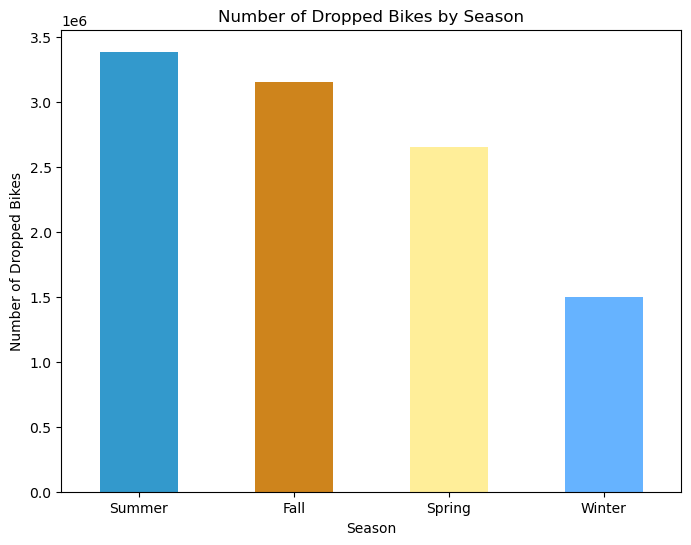

In [ ]:
import matplotlib.pyplot as plt

# Plot the number of dropped bikes per season
plt.figure(figsize=(8, 6))
season_counts.plot(kind='bar', color=['#3399cc', '#ce841c', '#ffee99', '#66b3ff'])
plt.title('Number of Dropped Bikes by Season')
plt.xlabel('Season')
plt.ylabel('Number of Dropped Bikes')
plt.xticks(rotation=0)
plt.show()


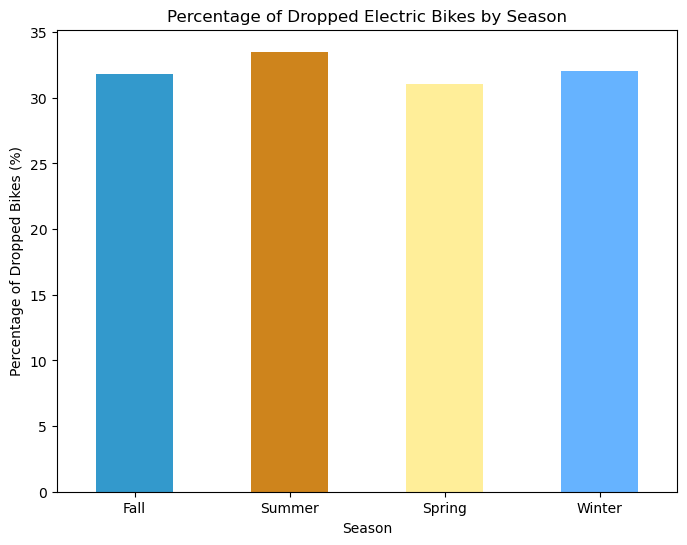

In [ ]:
# Plot the percentage of dropped bikes per season
plt.figure(figsize=(8, 6))
percentage_dropped_per_season.plot(kind='bar', color=['#3399cc', '#ce841c', '#ffee99', '#66b3ff'])
plt.title('Percentage of Dropped Electric Bikes by Season')
plt.xlabel('Season')
plt.ylabel('Percentage of Dropped Bikes (%)')
plt.xticks(rotation=0)
plt.show()


Good job mainatance team ( doesnt matter the season, batteries are equally charged)

In [ ]:
bike_weather

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693410,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693411,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693412,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693413,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter



Categorise temp

E-bike Drop Rates by Temperature Category:
                  drop_rate
temp_category              
Very Cold (<0°C)  29.738092
Cold (0-10°C)     28.296187
Mild (10-20°C)    28.653751
Warm (20-30°C)    30.788072
Hot (>30°C)       35.219319


D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\177330974.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bike_weather_electric['temp_category'] = pd.cut(bike_weather_electric[temp_col], bins=bins, labels=labels)
D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\177330974.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  temp_drop_data = bike_weather_electric.groupby('temp_category')['was_dropped'].agg(['sum', 'count'])
D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\177330974.py:34: FutureWarning: 

Passing `palette` without assigning `hue` i

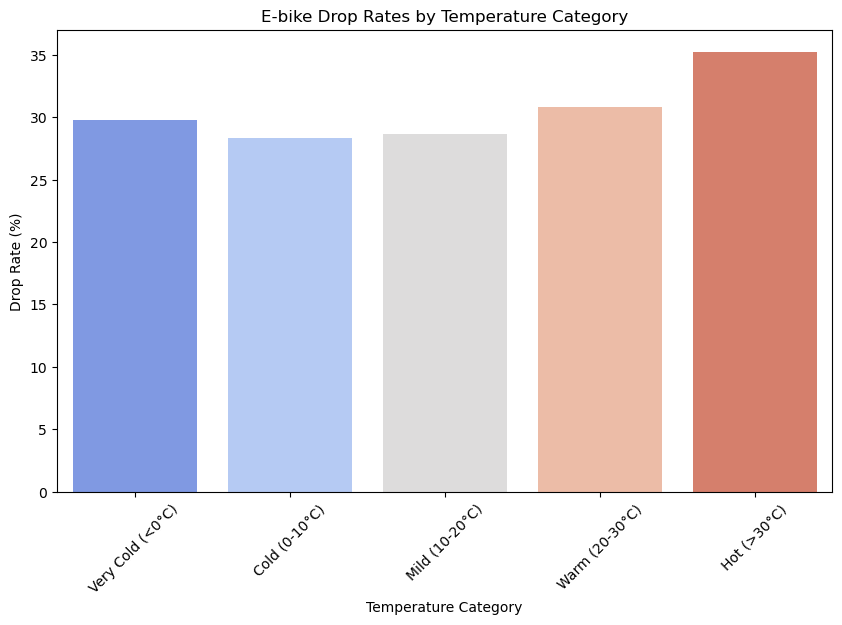

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter for electric bikes with valid trips
bike_weather_electric = bike_weather[ 
    (bike_weather['rideable_type'] == 'electric_bike') & 
    (bike_weather['trip_duration_minutes'] > 5) & 
    (bike_weather['start_station_name'] != bike_weather['end_station_name'])
]

# Define temperature categories
bins = [-float('inf'), 0, 10, 20, 30, float('inf')]  
labels = ['Very Cold (<0°C)', 'Cold (0-10°C)', 'Mild (10-20°C)', 'Warm (20-30°C)', 'Hot (>30°C)']

# Ensure the column name is correctly formatted
temp_col = 'apparent_temperature_mean (°C)'  # Check if this is the exact column name in your DataFrame

# Categorize temperature
bike_weather_electric['temp_category'] = pd.cut(bike_weather_electric[temp_col], bins=bins, labels=labels)

# Group by temperature category to calculate dropped bikes and total bikes rented
temp_drop_data = bike_weather_electric.groupby('temp_category')['was_dropped'].agg(['sum', 'count'])

# Calculate the drop rate as the sum of dropped bikes divided by total bikes rented
temp_drop_data['drop_rate'] = (temp_drop_data['sum'] / temp_drop_data['count']) * 100

# Print the drop rate by temperature category
print("E-bike Drop Rates by Temperature Category:")
print(temp_drop_data[['drop_rate']])

# Plot the relationship between temperature category and drop rate
plt.figure(figsize=(10, 6))
sns.barplot(x=temp_drop_data.index, y=temp_drop_data['drop_rate'], palette='coolwarm')

plt.title('E-bike Drop Rates by Temperature Category')
plt.xlabel('Temperature Category')
plt.ylabel('Drop Rate (%)')
plt.xticks(rotation=45)
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the following DataFrame filtered already
bike_weather_electric = bike_weather[ 
    (bike_weather['rideable_type'] == 'electric_bike') & 
    (bike_weather['trip_duration_minutes'] > 5) & 
    (bike_weather['start_station_name'] != bike_weather['end_station_name'])
]

# Calculate the correlation between trip duration and bike drop (was_dropped)
correlation = bike_weather_electric['trip_duration_minutes'].corr(bike_weather_electric['was_dropped'])
print(f"Correlation between trip duration and e-bike drop rate: {correlation}")


Correlation between trip duration and e-bike drop rate: 0.08154883172715373


In [ ]:
# Calculate the correlation between trip duration and bike drop (was_dropped)
correlation = bike_weather_electric['apparent_temperature_mean (°C)'].corr(bike_weather_electric['was_dropped'])
print(f"Correlation between trip duration and e-bike drop rate: {correlation}")

Correlation between trip duration and e-bike drop rate: 0.021461517948841418


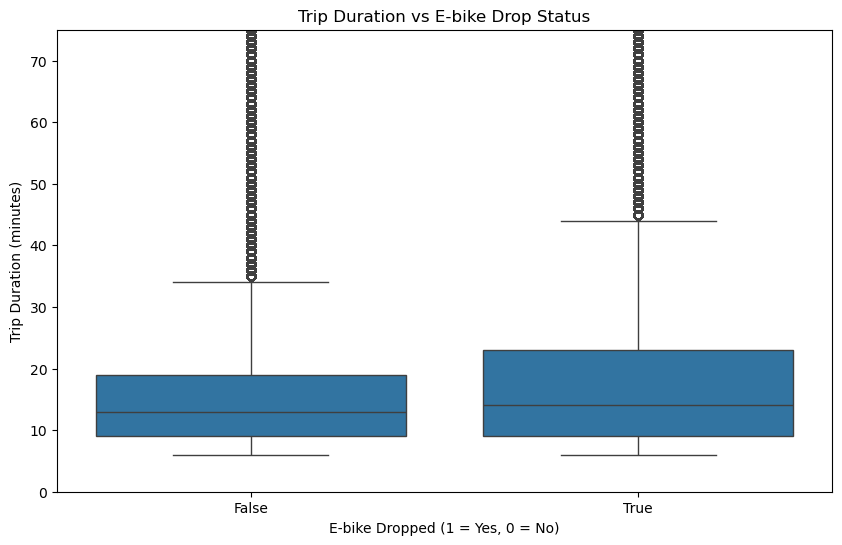

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot to compare trip duration for dropped vs non-dropped bikes
plt.figure(figsize=(10, 6))
sns.boxplot(x='was_dropped', y='trip_duration_minutes', data=bike_weather_electric)
plt.title('Trip Duration vs E-bike Drop Status')
plt.xlabel('E-bike Dropped (1 = Yes, 0 = No)')
plt.ylabel('Trip Duration (minutes)')
plt.ylim(0, 75)
plt.show()


In [ ]:
bike_weather.isna().sum()

ride_id                                  0
rideable_type                            0
started_at                               0
ended_at                                 0
start_station_name                  742374
start_station_id                    742374
end_station_name                    811227
end_station_id                      811227
start_lat                                2
start_lng                                2
end_lat                              16765
end_lng                              16765
member_casual                            0
was_dropped                              0
elevation                         10683359
start_elevation                       7317
end_elevation                         7322
elevation_change                     10081
start_elevation_label                    0
end_elevation_label                      0
trip_duration                            0
trip_duration_minutes                    0
Date                                     0
Casual     

In [ ]:
bike_weather

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693410,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693411,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693412,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693413,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter


In [ ]:
# import folium
# import pandas as pd

# # Assuming bike_weather DataFrame exists and contains 'latitude', 'longitude', and 'was_dropped' columns
# # Filter for dropped e-bikes
# dropped_bikes = bike_weather[(bike_weather['was_dropped'] == True) & (bike_weather['trip_duration_minutes'] > 5) & (bike_weather['start_station_name'] != bike_weather['end_station_name']) & (bike_weather["end_lat"].notna())]

# # Create a map centered around Washington, D.C.
# map_dc = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# # Add markers for each dropped e-bike
# for _, row in dropped_bikes.iterrows():
#     folium.Marker(location=[row['end_lat'], row['end_lng']],
#                   popup="Dropped E-Bike",
#                   icon=folium.Icon(color='red', icon='bolt', prefix='fa')
#                  ).add_to(map_dc)

# # Save map to an HTML file
# map_dc.save("dropped_ebikes_map.html")

# # To display in a Jupyter Notebook, uncomment the next line
# # map_dc

In [ ]:
# import folium
# import pandas as pd
# from folium.plugins import MarkerCluster

# # Assuming bike_weather DataFrame exists and contains 'latitude', 'longitude', and 'was_dropped' columns
# # Filter for dropped e-bikes
# dropped_bikes = bike_weather[(bike_weather['was_dropped'] == True) & (bike_weather['trip_duration_minutes'] > 5) & (bike_weather['start_station_name'] != bike_weather['end_station_name']) & (bike_weather["end_lat"].notna())]

# # Create a map centered around Washington, D.C.
# map_dc = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# # Use MarkerCluster for better performance
# marker_cluster = MarkerCluster().add_to(map_dc)

# # Add markers for each dropped e-bike
# for _, row in dropped_bikes.iterrows():
#     folium.Marker(location=[row['end_lat'], row['end_lng']],
#                   popup="Dropped E-Bike",
#                   icon=folium.Icon(color='red', icon='bolt', prefix='fa')
#                  ).add_to(marker_cluster)

# # Save map to an HTML file
# map_dc.save("dropped_ebikes_map.html")

# # To display in a Jupyter Notebook, uncomment the next line
# # map_dc

In [ ]:
dropped_bikes = bike_weather[(bike_weather['was_dropped'] == True) & 
                             (bike_weather['trip_duration_minutes'] > 5) & 
                             (bike_weather['start_station_name'] != bike_weather['end_station_name']) & 
                             (bike_weather["end_lat"].notna() &
                              (bike_weather['rideable_type'] == 'electric_bike'))]

In [ ]:
dropped_bikes[['end_lat', 'end_lng']]

,end_lat,end_lng
1,38.96,-77.02
7,38.90,-77.02
20,38.99,-77.03
21,38.92,-77.07
37,38.93,-77.04
...,...,...
10693381,38.94,-77.04
10693388,38.90,-77.02
10693395,38.92,-77.04
10693403,38.96,-76.98


In [ ]:
import folium
import pandas as pd
from folium.plugins import FastMarkerCluster

# Assuming bike_weather DataFrame exists and contains relevant columns
# Apply filtering conditions
dropped_bikes = bike_weather[(bike_weather['was_dropped'] == True) & 
                             (bike_weather['trip_duration_minutes'] > 5) & 
                             (bike_weather['start_station_name'] != bike_weather['end_station_name']) & 
                             (bike_weather["end_lat"].notna()) &
                             (bike_weather['rideable_type'] == 'electric_bike')]

# Filter out bikes with invalid latitude/longitude
dropped_bikes = dropped_bikes[
    (dropped_bikes['end_lat'].between(-90, 90)) & 
    (dropped_bikes['end_lng'].between(-180, 180))
]

# Create a map centered around Washington, D.C.
map_dc = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# Convert DataFrame to a list of coordinates
bike_locations = dropped_bikes[['end_lat', 'end_lng']].values.tolist()

# Use FastMarkerCluster for better performance
FastMarkerCluster(bike_locations).add_to(map_dc)

markers = [
    (38.90519649823313, -77.05778210820006, "red"),
    (38.87647393702995, -77.0175848409192, "red"),
    (38.89236003898285, -77.03358238848003, "red"),
    (38.884565900211356, -76.99588968209255, "red")
]

for lat, lng, color in markers:
    folium.Marker(
        location=[lat, lng], 
        icon=folium.Icon(color=color)
    ).add_to(map_dc)


# Save map to an HTML file
map_dc.save("dropped_ebikes_map.html")

# To display in a Jupyter Notebook, uncomment the next line
map_dc

In [ ]:
bike_weather

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693410,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693411,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693412,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693413,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter


In [ ]:
drop_off_counts_by_year = bike_weather[bike_weather['was_dropped'] == True] \
    .groupby(['year', 'end_lat', 'end_lng']) \
    .size() \
    .reset_index(name='drop_count')


In [ ]:
top_drop_offs_by_year = drop_off_counts_by_year \
    .sort_values(by=['year', 'drop_count'], ascending=[True, False]) \
    .groupby('year') \
    .head(15)

print(top_drop_offs_by_year)

      year  end_lat  end_lng  drop_count
395   2021    38.92   -77.04        8988
431   2021    38.93   -77.03        7634
359   2021    38.91   -77.04        7261
396   2021    38.92   -77.03        7165
360   2021    38.91   -77.03        6917
318   2021    38.90   -77.03        6308
319   2021    38.90   -77.02        5032
361   2021    38.91   -77.02        4215
321   2021    38.90   -77.00        4167
362   2021    38.91   -77.01        3764
432   2021    38.93   -77.02        3710
363   2021    38.91   -77.00        3660
316   2021    38.90   -77.05        3567
397   2021    38.92   -77.02        3383
358   2021    38.91   -77.05        3371
1205  2022    38.93   -77.03        5459
1172  2022    38.92   -77.04        5452
1173  2022    38.92   -77.03        4866
1140  2022    38.91   -77.04        4535
1104  2022    38.90   -77.03        4370
1105  2022    38.90   -77.02        4345
1141  2022    38.91   -77.03        4311
1144  2022    38.91   -77.00        3080
1103  2022    38

In [ ]:
# import numpy as np

# # Function to add small variation to coordinates
# def jitter(val, scale=0.0003):  # Adjust scale if needed
#     return val + np.random.uniform(-scale, scale)
# # Create a new map centered around a location (e.g., Washington, D.C.)
# map_high_demand = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# # Apply jitter to overlapping markers
# top_drop_offs_by_year['end_lat_jitter'] = top_drop_offs_by_year['end_lat'].apply(jitter)
# top_drop_offs_by_year['end_lng_jitter'] = top_drop_offs_by_year['end_lng'].apply(jitter)

# # Now plot the adjusted coordinates
# for index, row in top_drop_offs_by_year.iterrows():
#     folium.Marker(
#         location=[row['end_lat_jitter'], row['end_lng_jitter']], 
#         popup=f"Year: {row['year']} - Dropped: {row['drop_count']}", 
#         icon=folium.Icon(color=colors[row['year']])
#     ).add_to(map_high_demand)

#     markers = [
#     (38.90519649823313, -77.05778210820006, "black"),
#     (38.87647393702995, -77.0175848409192, "black"),
#     (38.89236003898285, -77.03358238848003, "black"),
#     (38.884565900211356, -76.99588968209255, "black")
# ]

# for lat, lng, color in markers:
#     folium.Marker(
#         location=[lat, lng], 
#         icon=folium.Icon(color=color)
#     ).add_to(map_high_demand)

# map_high_demand.save("dropped_ebikes_map_updated.html")
# map_high_demand

In [ ]:
import requests

# Function to get elevation from the Open Elevation API
def get_elevation(lat, lng):
    url = f"https://api.open-elevation.com/api/v1/lookup?locations={lat},{lng}"
    response = requests.get(url)
    data = response.json()
    return data['results'][0]['elevation'] if 'results' in data else None

# List of unique coordinates to check elevation for
coordinates = [
    (38.92, -77.04),
    (38.93, -77.03),
    (38.91, -77.04),
    (38.92, -77.03),
    (38.91, -77.03),
    (38.90, -77.03),
    (38.90, -77.02),
    (38.91, -77.02),
    (38.90, -77.00),
    (38.91, -77.01),
    (38.90, -77.04),
    (38.91, -77.00),
    (38.91, -77.02),
    (38.93, -77.04),
    (38.90, -77.05)
]

# Get elevations for the unique coordinates
unique_elevations = [(lat, lng, get_elevation(lat, lng)) for lat, lng in coordinates]
unique_elevations


[(38.92, -77.04, 44.0),
 (38.93, -77.03, 62.0),
 (38.91, -77.04, 35.0),
 (38.92, -77.03, 39.0),
 (38.91, -77.03, 35.0),
 (38.9, -77.03, 41.0),
 (38.9, -77.02, 13.0),
 (38.91, -77.02, 29.0),
 (38.9, -77.0, None),
 (38.91, -77.01, 22.0),
 (38.9, -77.04, 45.0),
 (38.91, -77.0, 29.0),
 (38.91, -77.02, None),
 (38.93, -77.04, 59.0),
 (38.9, -77.05, 27.0)]

In [ ]:
# import requests
# import pandas as pd
# import time
# from dotenv import load_dotenv
# import os

# # Load environment variables for your API key
# load_dotenv()

# # Retrieve the API key securely from environment variables
# api_key = os.getenv('OPENROUTESERVICE_API_KEY')

# # Check if the API key is found
# if not api_key:
#     print("API key not found.")
#     exit()

# # Define headers for the request
# headers = {
#     'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
# }

# # Coordinates you provided
# coordinates = [
#     (38.92, -77.04),
#     (38.93, -77.03),
#     (38.91, -77.04),
#     (38.92, -77.03),
#     (38.91, -77.03),
#     (38.90, -77.03),
#     (38.90, -77.02),
#     (38.91, -77.02),
#     (38.90, -77.00),
#     (38.91, -77.01),
#     (38.90, -77.04),
#     (38.91, -77.00),
#     (38.91, -77.02),
#     (38.93, -77.04),
#     (38.90, -77.05)
# ]

# # Prepare to store results
# elevation_data = []

# # Counter to track the number of requests made
# request_count = 0

# # Loop through coordinates to get the elevation
# for coord in coordinates:
#     lat, lng = coord
#     print(f"Fetching elevation for coordinates: {lat}, {lng}")

#     # Construct the API URL for the elevation endpoint
#     url = f'https://api.openrouteservice.org/elevation/point?api_key={api_key}&geometry={lng},{lat}&format_out=point&dataset=srtm'

#     # Make the API request
#     response = requests.get(url, headers=headers)

#     if response.status_code == 200:
#         # Parse the response data
#         data = response.json()

#         # Check if the response contains the elevation data
#         if 'geometry' in data and len(data['geometry']) > 2:
#             elevation = data['geometry'][2]  # Elevation is the third value in the geometry list
#             elevation_data.append({
#                 'latitude': lat,
#                 'longitude': lng,
#                 'elevation': elevation
#             })
#             print(f"Elevation for {lat}, {lng}: {elevation} meters")
#         else:
#             print(f"Unexpected response structure for {lat}, {lng}. Skipping this coordinate.")
#     else:
#         print(f"Error for coordinate {lat}, {lng}: {response.status_code} - {response.text}")

#     # Increase request count
#     request_count += 1

#     # Check if we've made 100 requests, then sleep for a minute to respect rate limit
#     if request_count >= 100:
#         print("Reached 100 requests. Sleeping for 60 seconds to respect rate limit...")
#         time.sleep(60)  # Sleep for 60 seconds
#         request_count = 0  # Reset the request count

#     # To avoid exceeding the API rate limit, sleep for a short period between requests (e.g., 0.6 seconds)
#     time.sleep(0.6)

# # Convert the result into a DataFrame
# elevation_dropped = pd.DataFrame(elevation_data)

# # Show the results
# print(elevation_dropped)


In [ ]:
import folium
import numpy as np
from folium.plugins import HeatMap

# Create the map
map_high_demand = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# Extract coordinates and weights (drop count)
heat_data = [
    [row['end_lat'], row['end_lng'], row['drop_count']]
    for _, row in top_drop_offs_by_year.iterrows()
]

# Add Heatmap layer
HeatMap(heat_data, radius=25, blur=15, min_opacity=0.3).add_to(map_high_demand)

# Save map
map_high_demand.save("dropped_ebikes_heatmap.html")
map_high_demand



In [ ]:
import folium
import numpy as np

# Create map
map_high_demand = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# Normalize drop count for circle size
max_drop_count = top_drop_offs_by_year["drop_count"].max()
min_size, max_size = 3, 20  # Min and max circle sizes
scale_factor = (max_size - min_size) / max_drop_count if max_drop_count > 0 else 1

# Define error radius (1.1km)
error_radius = 1100  # meters

# Function to determine circle color
def get_color(count, max_count):
    colors = ["yellow", "orange", "red"]
    return colors[min(int(count / max_count * 3), 2)]  # Scale to color range

# Add drop-off locations with error zones
for _, row in top_drop_offs_by_year.iterrows():
    circle_size = min_size + row["drop_count"] * scale_factor
    color = get_color(row["drop_count"], max_drop_count)  

    # Add semi-transparent error circle
    folium.Circle(
        location=[row['end_lat'], row['end_lng']],
        radius=error_radius,
        color='blue',
        fill=True,
        fill_opacity=0.15,  # Soft transparency for better visibility
        weight=1  # Thin border
    ).add_to(map_high_demand)

    # Add main drop-off circle
    folium.CircleMarker(
        location=[row['end_lat'], row['end_lng']],
        radius=circle_size,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7  # More visible
    ).add_to(map_high_demand)

# Save map
map_high_demand.save("dropped_ebikes_with_error_circles.html")
map_high_demand



In [ ]:
elevation

,station_name,latitude,longitude,elevation,elevation_label
0,Maine Ave & 9th St SW,38.880440,-77.025236,3.0,low
1,10th & U St NW,38.917193,-77.025894,31.0,medium
2,17th & Corcoran St NW,38.912138,-77.038568,29.0,medium
3,Wilson Blvd. & N. Vermont St.,38.879477,-77.114563,82.0,high
4,11th & Park Rd NW,38.931322,-77.028247,60.0,medium
...,...,...,...,...,...
854,Old Meadow Rd & Cathy Ln,38.916908,-77.213879,121.0,high
855,Route 29 & Circle Woods Dr,38.869114,-77.271538,102.0,high
856,Prosperity Ave & Avenir Pl,38.881436,-77.230377,119.0,high
857,Kingsbridge Dr & Draper Dr,38.868545,-77.282083,98.0,high


In [ ]:
# import folium
# import numpy as np

# # Create map
# map_high_demand = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# # Normalize drop count for circle size
# max_drop_count = top_drop_offs_by_year["drop_count"].max()
# min_size, max_size = 3, 20  # Min and max circle sizes
# scale_factor = (max_size - min_size) / max_drop_count if max_drop_count > 0 else 1

# # Define error radius (1.1km)
# error_radius = 1100  # in meters

# # Function to determine circle color
# def get_color(count, max_count):
#     colors = ["yellow", "orange", "red"]
#     return colors[min(int(count / max_count * 3), 2)]

# # Add drop-off locations with error zones
# for _, row in top_drop_offs_by_year.iterrows():
#     circle_size = min_size + row["drop_count"] * scale_factor
#     color = get_color(row["drop_count"], max_drop_count)
    
#     # Add semi-transparent error circle
#     folium.Circle(
#         location=[row['end_lat'], row['end_lng']],
#         radius=error_radius,
#         color='blue',
#         fill=True,
#         fill_opacity=0.15,
#         weight=1
#     ).add_to(map_high_demand)
    
#     # Add main drop-off circle
#     folium.CircleMarker(
#         location=[row['end_lat'], row['end_lng']],
#         radius=circle_size,
#         color=color,
#         fill=True,
#         fill_color=color,
#         fill_opacity=0.7
#     ).add_to(map_high_demand)

# # Add existing stations from the elevation data
# for _, station_row in elevation.iterrows():
#     folium.Circle(
#         location=[station_row['latitude'], station_row['longitude']],
#         icon=folium.Icon(color='green'),
#         radius = 3,
#         fill = True,
#         color = 'black',
#         popup=f"Station: {station_row['station_name']}"
#     ).add_to(map_high_demand)

# # Save map
# map_high_demand.save("dropped_ebikes_with_existing_stations.html")
# map_high_demand


In [ ]:
# Count the number of rides starting at each station by bike type
start_counts = data.groupby(['start_station_name', 'rideable_type']).size()

# Count the number of rides ending at each station by bike type
end_counts = data.groupby(['end_station_name', 'rideable_type']).size()

# Merge the counts on both station name and rideable_type, filling missing values with 0
station_demand = pd.DataFrame({
    'starts': start_counts,
    'ends': end_counts
}).fillna(0)  # Fill NaN values with 0 for stations/bike types with no starts or ends

# Calculate net demand (starts - ends) for each station and bike type
station_demand['net_demand'] = station_demand['starts'] - station_demand['ends']

# Sort by net demand to find stations with the highest demand
station_demand = station_demand.sort_values(by='net_demand', ascending=False)

# Reset the index to make 'rideable_type' a column
station_demand = station_demand.reset_index()

# Rename the column in case 'level_0' appears
station_demand = station_demand.rename(columns={'level_0': 'start_station_name'})

# Now you can filter for 'electric_bike' in the 'rideable_type' column
station_demand_electric = station_demand[station_demand['rideable_type'] == 'electric_bike']

# Display the results for 'electric_bike'
station_demand_electric

,start_station_name,rideable_type,starts,ends,net_demand
44,Park Rd & Holmead Pl NW,electric_bike,12238.0,9652.0,2586.0
54,11th & Kenyon St NW,electric_bike,12366.0,10228.0,2138.0
65,14th & Otis Pl NW,electric_bike,9860.0,8187.0,1673.0
74,14th & Irving St NW,electric_bike,18418.0,16914.0,1504.0
76,Columbia Rd & Georgia Ave NW,electric_bike,9493.0,8027.0,1466.0
...,...,...,...,...,...
2112,6035 Warehouse,electric_bike,50.0,91.0,-41.0
2121,M St & Delaware Ave NE,electric_bike,5159.0,5203.0,-44.0
2157,1st & I St SE,electric_bike,6311.0,6373.0,-62.0
2159,3rd & M St SE,electric_bike,1734.0,1797.0,-63.0


In [ ]:
# Vectorized condition for Supply_Status
station_demand_electric['Supply_Status'] = np.where(station_demand_electric['net_demand'] < -5, 'Oversupplied',
                                           np.where(station_demand_electric['net_demand'] > 5, 'Undersupplied', 'Perfect'))

# Display the updated DataFrame
station_demand_electric[['net_demand', 'Supply_Status']]

D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\979680936.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_demand_electric['Supply_Status'] = np.where(station_demand_electric['net_demand'] < -5, 'Oversupplied',


,net_demand,Supply_Status
44,2586.0,Undersupplied
54,2138.0,Undersupplied
65,1673.0,Undersupplied
74,1504.0,Undersupplied
76,1466.0,Undersupplied
...,...,...
2112,-41.0,Oversupplied
2121,-44.0,Oversupplied
2157,-62.0,Oversupplied
2159,-63.0,Oversupplied


In [ ]:
elevation = elevation.rename(columns = {'station_name' : 'start_station_name'})

In [ ]:
elevation = pd.merge(elevation, station_demand_electric, on = 'start_station_name')

In [ ]:
elevation

,start_station_name,latitude,longitude,elevation,elevation_label,rideable_type,starts,ends,net_demand,Supply_Status
0,Maine Ave & 9th St SW,38.880440,-77.025236,3.0,low,electric_bike,7594.0,7529.0,65.0,Undersupplied
1,10th & U St NW,38.917193,-77.025894,31.0,medium,electric_bike,4420.0,4370.0,50.0,Undersupplied
2,17th & Corcoran St NW,38.912138,-77.038568,29.0,medium,electric_bike,8024.0,7986.0,38.0,Undersupplied
3,Wilson Blvd. & N. Vermont St.,38.879477,-77.114563,82.0,high,electric_bike,341.0,335.0,6.0,Undersupplied
4,11th & Park Rd NW,38.931322,-77.028247,60.0,medium,electric_bike,10118.0,9299.0,819.0,Undersupplied
...,...,...,...,...,...,...,...,...,...,...
845,Massachusetts & Idaho Ave NW,38.931350,-77.077238,103.0,high,electric_bike,71.0,70.0,1.0,Perfect
846,Dorr Ave & Prosperity Ave,38.879256,-77.233583,106.0,high,electric_bike,1.0,1.0,0.0,Perfect
847,Tyco Rd & Boyd Pointe Way,38.930767,-77.241436,119.0,high,electric_bike,3.0,3.0,0.0,Perfect
848,Old Meadow Rd & Cathy Ln,38.916908,-77.213879,121.0,high,electric_bike,4.0,0.0,4.0,Perfect


In [ ]:
import folium
import numpy as np

# Create map
map_high_demand = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

# Normalize drop count for circle size
max_drop_count = top_drop_offs_by_year["drop_count"].max()
min_size, max_size = 3, 20  # Min and max circle sizes
scale_factor = (max_size - min_size) / max_drop_count if max_drop_count > 0 else 1

# Define error radius (1.1km)
error_radius = 1100  # in meters

# Function to determine circle color based on drop count
def get_color(count, max_count):
    colors = ["yellow", "orange", "red"]
    return colors[min(int(count / max_count * 3), 2)]

# Function to determine station color based on Supply_Status (cleaned)
def get_station_color(status):
    status = status.strip().lower()  # Clean the status by trimming spaces and making it lowercase
    if status == "undersupplied":
        return 'red'
    elif status == "oversupplied":
        return 'black'
    elif status == "perfect":
        return 'green'
    else:
        return 'gray'  # Default color for unknown statuses

# Add drop-off locations with error zones
for _, row in top_drop_offs_by_year.iterrows():
    circle_size = min_size + row["drop_count"] * scale_factor
    color = get_color(row["drop_count"], max_drop_count)
    
    # Add semi-transparent error circle
    folium.Circle(
        location=[row['end_lat'], row['end_lng']],
        radius=error_radius,
        color='blue',
        fill=True,
        fill_opacity=0.15,
        weight=1
    ).add_to(map_high_demand)
    
    # Add main drop-off circle
    folium.CircleMarker(
        location=[row['end_lat'], row['end_lng']],
        radius=circle_size,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7
    ).add_to(map_high_demand)

# Add existing stations from the elevation data
for _, station_row in elevation.iterrows():
    station_color = get_station_color(station_row['Supply_Status'])  # Determine color based on Supply_Status
    
    folium.Circle(
        location=[station_row['latitude'], station_row['longitude']],
        radius=5,  # Smaller size for the stations
        color=station_color,
        fill=True,
        fill_color=station_color,
        fill_opacity=1,
        popup=f"Station: {station_row['start_station_name']} - Status: {station_row['Supply_Status']}"
    ).add_to(map_high_demand)

# Add custom markers (your list of locations)
markers = [
    (38.90519649823313, -77.05778210820006, "black", "M St NW & 31 St NW"),
    (38.87647393702995, -77.0175848409192, "black", "Waterfront"),
    (38.894371867248516, -77.02818002317277, "black", "Federal Traingle"),
    (38.884565900211356, -76.99588968209255, "black", "Eastern Martker"),
    (38.92894012367768, -77.03258041119432, 'pink', 'Columbia Heights'),
    (38.924893059540196, -77.0506973491215, 'pink', 'Woodley Park-Zoo/Adams Morgan'),
    (38.916979932378396, -77.02717974103486, 'pink', 'U Street/ African-Amer Civil War Memorial'),
    (38.914742727991, -77.02069952423014, 'pink', 'Shaw-Howard Univ Station'),
    (38.91150366533188, -77.04297258728744, 'pink', 'Dupont Circle Metro Station'),
    (38.90533497388739, -77.02231543831327, 'pink', 'MT Vernon Sq 7th St Convention Center'),
    (38.90328509518513, -77.03797982581618, 'pink', 'Farragut North'),
    (38.901579524836926, -77.04127471313811, 'pink', 'Farraguth West'),
    (38.93714470336547, -77.02287390861203, 'pink', 'Georgia Ave-Petworth'),
    (38.897315856445765, -77.01925584113204, 'pink', 'Judiciary Square'),
    (38.93613825862532, -77.0584777603569, 'pink', 'Cleveland Park'),
    (38.90188669578043, -77.02985884475972, 'pink', 'McPherson Sq Metro Station'),
    (38.898144248797784, -77.03036846281832, 'pink', 'Metro Center Station'),
    (38.921102854316736, -76.99258011280048, 'pink', 'Rhore Island Ave-Brentwood'),
    (38.92868216666667, -77.0322465, 'orange', "14th & Irving St NW"),
    (38.905721, -77.00551833333333, 'orange', "1st & M St NE"),
    (38.909855666666665, -77.03436783333333, 'orange',"15th & P St NW"),
    (38.92306133333334, -77.04252566666666, 'orange', 'Adams Mill & Columbia Rd NW'),
    (38.931959, -77.03873883333333, 'orange', 'Lamont & Mt Pleasant NW'),
    (38.91568133333333, -77.03824716666666, 'orange', 'New Hampshire Ave & T St NW'),
    (38.92409933333333, -77.040742, 'orange', "Columbia & Ontario Rd NW"),
    (38.907887, -77.071658, 'orange', '37th & O St NW / Georgetown University')
]

for lat, lng, color, message in markers:
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color=color),
        popup= message
    ).add_to(map_high_demand)

# Save map
map_high_demand.save("dropped_ebikes_with_existing_stations.html")
map_high_demand


In [ ]:
import folium

# Initialize the map centered at a general location
map_example = folium.Map(location=[38.9072, -77.0369], zoom_start=12)

# List of markers with latitude, longitude, color, and description
markers = [
    (38.90519649823313, -77.05778210820006, "black", "M St NW & 31 St NW"),
    (38.87647393702995, -77.0175848409192, "black", "Waterfront"),
    (38.894371867248516, -77.02818002317277, "black", "Federal Triangle"),
    (38.884565900211356, -76.99588968209255, "black", "Eastern Market")
]

# Add each marker to the map
for lat, lng, color, message in markers:
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color=color),
        popup=message
    ).add_to(map_example)

# Display the map
map_example


In [ ]:
electric_member_casual = data[(data['rideable_type'] == 'electric_bike')].groupby('member_casual').size()
total_rides = electric_member_casual.sum()
percetage = (electric_member_casual/total_rides)* 100
percetage

member_casual
casual    39.258825
member    60.741175
dtype: float64

In [ ]:
member_e_bikes = data[(data['rideable_type'] == 'electric_bike') & (data['member_casual'] == 'member')]
station_counts = member_e_bikes.groupby('start_station_name').size()
sorted_stations = station_counts.sort_values(ascending=False)
sorted_stations.head()


start_station_name
14th & Irving St NW            12493
Adams Mill & Columbia Rd NW     9727
New Hampshire Ave & T St NW     9219
1st & M St NE                   9065
Lamont & Mt Pleasant NW         9008
dtype: int64

In [ ]:
station_counts_end = member_e_bikes.groupby('end_station_name').size()
sorted_stations_end= station_counts_end.sort_values(ascending=False)
sorted_stations_end.head()

end_station_name
14th & Irving St NW            11689
Adams Mill & Columbia Rd NW     9662
Columbia & Ontario Rd NW        9348
Lamont & Mt Pleasant NW         9340
New Hampshire Ave & T St NW     9316
dtype: int64

In [ ]:
casual_e_bikes = data[(data['rideable_type'] == 'electric_bike') & (data['member_casual'] == 'casual')]
station_counts_casual = casual_e_bikes.groupby('end_station_name').size()
sorted_stations_casual = station_counts_casual.sort_values(ascending=False)
sorted_stations_casual.head()

end_station_name
Adams Mill & Columbia Rd NW        6218
Lamont & Mt Pleasant NW            5507
Columbus Circle / Union Station    5439
1st & M St NE                      5272
14th & Irving St NW                5225
dtype: int64

In [ ]:
station_counts_casual_start = casual_e_bikes.groupby('start_station_name').size()
sorted_stations_casual_start = station_counts_casual_start.sort_values(ascending=False)
sorted_stations_casual_start.head()

start_station_name
Lamont & Mt Pleasant NW            6486
Adams Mill & Columbia Rd NW        6413
14th & Irving St NW                5925
Columbus Circle / Union Station    5691
1st & M St NE                      5159
dtype: int64

In [ ]:
member_e_bikes['year'] = pd.to_datetime(member_e_bikes['started_at']).dt.year
station_counts = member_e_bikes.groupby(['year', 'start_station_name']).size()

# Posortowanie danych w ramach każdego roku
sorted_stations = station_counts.groupby(level=0, group_keys=False).apply(lambda x: x.sort_values(ascending=False))

# Wyświetl 5 najpopularniejszych stacji w każdym roku
sorted_stations.groupby(level=0).head(15)

D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\267591024.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  member_e_bikes['year'] = pd.to_datetime(member_e_bikes['started_at']).dt.year


year  start_station_name                                 
2021  14th & Irving St NW                                    2485
      1st & M St NE                                          2138
      15th & P St NW                                         1959
      Adams Mill & Columbia Rd NW                            1875
      New Hampshire Ave & T St NW                            1799
      Columbia & Ontario Rd NW                               1732
      Lamont & Mt Pleasant NW                                1730
      Reservoir Rd & 38th St NW                              1663
      14th & V St NW                                         1497
      37th & O St NW / Georgetown University                 1480
      14th & Rhode Island Ave NW                             1462
      Massachusetts Ave & Dupont Circle NW                   1450
      18th St & Wyoming Ave NW                               1448
      5th & K St NW                                          1437
      11th & Park 

In [ ]:
member_e_bikes['year'] = pd.to_datetime(member_e_bikes['started_at']).dt.year
station_counts = member_e_bikes.groupby(['year', 'end_station_name']).size()

# Posortowanie danych w ramach każdego roku
sorted_stations_end = station_counts.groupby(level=0, group_keys=False).apply(lambda x: x.sort_values(ascending=False))

# Wyświetl 5 najpopularniejszych stacji w każdym roku
sorted_stations_end.groupby(level=0).head(15)

D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\1063617046.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  member_e_bikes['year'] = pd.to_datetime(member_e_bikes['started_at']).dt.year


year  end_station_name                                   
2021  14th & Irving St NW                                    2391
      1st & M St NE                                          2161
      Reservoir Rd & 38th St NW                              2059
      15th & P St NW                                         2009
      Adams Mill & Columbia Rd NW                            1901
      Lamont & Mt Pleasant NW                                1881
      New Hampshire Ave & T St NW                            1855
      Columbia & Ontario Rd NW                               1737
      18th St & Wyoming Ave NW                               1622
      37th & O St NW / Georgetown University                 1563
      5th & K St NW                                          1484
      14th & V St NW                                         1477
      14th St & Spring Rd NW                                 1442
      Eastern Market Metro / Pennsylvania Ave & 8th St SE    1442
      14th & Rhode

In [ ]:
# Get the top 10 end stations per year
top_10_end_stations = sorted_stations_end.groupby(level=0).head(20).reset_index()

# Count how many years each station appears in the top 10
station_year_counts = top_10_end_stations['end_station_name'].value_counts()

# Find stations that appear in top 10 for every year
years_count = top_10_end_stations['year'].nunique()  # Total number of years in the dataset
stations_in_all_years = station_year_counts[station_year_counts == years_count]

print("Stations that appeared in the top 10 every year:")
print(stations_in_all_years.index.tolist())


Stations that appeared in the top 10 every year:
['14th & Irving St NW', '14th & Belmont St NW', 'Massachusetts Ave & Dupont Circle NW', 'Eastern Market Metro / Pennsylvania Ave & 8th St SE', '1st & M St NE', '14th & V St NW', '5th & K St NW', '37th & O St NW / Georgetown University', '18th St & Wyoming Ave NW', 'Columbia & Ontario Rd NW', 'New Hampshire Ave & T St NW', 'Lamont & Mt Pleasant NW', 'Adams Mill & Columbia Rd NW', '15th & P St NW', '8th & O St NW']


In [ ]:
# Get the top 10 end stations per year
top_10_start_stations = sorted_stations.groupby(level=0).head(15).reset_index()

# Count how many years each station appears in the top 10
station_year_counts = top_10_start_stations['start_station_name'].value_counts()

# Find stations that appear in top 10 for every year
years_count = top_10_start_stations['year'].nunique()  # Total number of years in the dataset
stations_in_all_years = station_year_counts[station_year_counts == years_count]

print("Stations that appeared in the top 10 every year:")
print(stations_in_all_years.index.tolist())

Stations that appeared in the top 10 every year:
['14th & Irving St NW', '15th & P St NW', 'Adams Mill & Columbia Rd NW', 'New Hampshire Ave & T St NW', 'Columbia & Ontario Rd NW', 'Lamont & Mt Pleasant NW', '14th & V St NW', '37th & O St NW / Georgetown University', '1st & M St NE']


In [ ]:
stations_of_interest= ['14th & Irving St NW', '14th & Belmont St NW', 'Massachusetts Ave & Dupont Circle NW', 'Eastern Market Metro / Pennsylvania Ave & 8th St SE', '1st & M St NE', '14th & V St NW', '5th & K St NW', '37th & O St NW / Georgetown University', '18th St & Wyoming Ave NW', 'Columbia & Ontario Rd NW', 'New Hampshire Ave & T St NW', 'Lamont & Mt Pleasant NW', 'Adams Mill & Columbia Rd NW', '15th & P St NW', '8th & O St NW']
stations_with_coordinates = member_e_bikes[member_e_bikes['end_station_name'].isin(stations_of_interest)]

In [ ]:
for station in stations_of_interest:
    station_data = stations_with_coordinates[stations_with_coordinates['start_station_name'] == station]
    latitude = station_data['start_lat'].iloc[0]
    longitude = station_data['start_lng'].iloc[0]
    print(f"{station}: {latitude}, {longitude}")

14th & Irving St NW: 38.928676333333335, -77.03228333333334
14th & Belmont St NW: 38.92104116666667, -77.03201166666666
Massachusetts Ave & Dupont Circle NW: 38.91012966666667, -77.04420566666667
Eastern Market Metro / Pennsylvania Ave & 8th St SE: 38.884338166666666, -76.9947225
1st & M St NE: 38.905764833333336, -77.00551633333333
14th & V St NW: 38.91773233333333, -77.03205766666666
5th & K St NW: 38.903165, -77.01896616666667
37th & O St NW / Georgetown University: 38.907887, -77.071658
18th St & Wyoming Ave NW: 38.918741833333335, -77.04158683333333
Columbia & Ontario Rd NW: 38.9241565, -77.04076516666667
New Hampshire Ave & T St NW: 38.91568133333333, -77.03824716666666
Lamont & Mt Pleasant NW: 38.931959, -77.03873883333333
Adams Mill & Columbia Rd NW: 38.92306133333334, -77.04252566666666
15th & P St NW: 38.909892, -77.034337
8th & O St NW: 38.9086465, -77.02287283333334


In [ ]:
dropped_bikes_member = dropped_bikes[(dropped_bikes['rideable_type'] == 'electric_bike') & (dropped_bikes['member_casual'] == 'member')]

In [ ]:
map_top_10_stations = folium.Map(location=[38.9072, -77.0369], zoom_start=13)

markers = [(38.92868216666667, -77.0322465, 'orange', "14th & Irving St NW", '14270'),
           (38.909855666666665, -77.03436783333333, 'orange',"15th & P St NW", '21852'),
           (38.92306133333334, -77.04252566666666, 'orange', 'Adams Mill & Columbia Rd NW','12197'),
           (38.931959, -77.03873883333333, 'orange', 'Lamont & Mt Pleasant NW','7204'),
            (38.907887, -77.071658, 'orange', '37th & O St NW / Georgetown University', '3783'),
            (38.91773233333333, -77.03205766666666, 'orange', '14th & V St NW', '13686'),
            (38.903165, -77.01896616666667,'orange','5th & K St NW','10968'),
            (38.91012966666667, -77.04420566666667,'orange','Massachusetts Ave & Dupont Circle NW', '5137'),
            (38.90519649823313, -77.05778210820006, "black", "M St NW & 31 St NW", 'existing'),
            (38.87647393702995, -77.0175848409192, "black", "Waterfront", 'existing'),
            (38.894371867248516, -77.02818002317277, "black", "Federal Triangle", 'existing'),
            (38.884565900211356, -76.99588968209255, "black", "Eastern Market",'existing')
           ]


# Loop through each station and add the marker and a circle (500m radius)
for lat, lng, color, name, dropped_bikes in markers:
    # Add circle with 500m radius
    folium.Circle(
        location=[lat, lng],
        radius=500,  # Radius in meters
        color='blue',  # Circle border color
        fill=True,
        fill_color=color,  # Circle fill color
        fill_opacity=0.2  # Transparency of the fill
    ).add_to(map_top_10_stations)

    # Add marker with popup showing station name and dropped bike count
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color=color),
        popup=f'{name}\nDropped bikes: {dropped_bikes}'
    ).add_to(map_top_10_stations)

# Display the map
map_top_10_stations.save('top_10_stations.html')
map_top_10_stations


In [ ]:
filtered_data = data[(data['trip_duration_minutes'] > 3) & (data['member_casual'] == 'member')]
filtered_data['trip_duration_minutes'].mean()

15.449334441632613

In [ ]:
sum_dropped_bikes = dropped_bikes_member['was_dropped'].sum()
print(f"Total dropped bikes: {sum_dropped_bikes}")

Total dropped bikes: 330490


In [ ]:
# import pandas as pd
# from geopy.distance import geodesic

# stations = [
#     (38.92868216666667, -77.0322465, '14th & Irving St NW'),
#     (38.905721, -77.00551833333333, '1st & M St NE'),
#     (38.909855666666665, -77.03436783333333, '15th & P St NW'),
#     (38.92306133333334, -77.04252566666666, 'Adams Mill & Columbia Rd NW'),
#     (38.931959, -77.03873883333333, 'Lamont & Mt Pleasant NW'),
#     (38.91568133333333, -77.03824716666666, 'New Hampshire Ave & T St NW'),
#     (38.92409933333333, -77.040742, 'Columbia & Ontario Rd NW'),
#     (38.907887, -77.071658, '37th & O St NW / Georgetown University'),
#     (38.91773233333333, -77.03205766666666, '14th & V St NW'),
#     (38.884338166666666, -76.9947225, 'Eastern Market Metro / Pennsylvania Ave & 8th St SE')
# ]

# # Tworzymy słownik ze stacjami, gdzie wartością początkową jest 0
# dropped_bikes_within_radius = {station_name: 0 for _, _, station_name in stations}

# # Iterujemy po DataFrame dropped_bikes_2023
# for _, row in dropped_bikes_member.iterrows():
#     min_distance = float("inf")
#     closest_station = None

#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
#         if distance <= 600 and distance < min_distance:
#             min_distance = distance
#             closest_station = station_name

#     if closest_station:
#         dropped_bikes_within_radius[closest_station] += 1

# # Wyświetlenie wyników
# print(dropped_bikes_within_radius)


In [ ]:
dropped_bikes_member[(dropped_bikes_member['year'] == 2023)]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
6226445,EC9157E03F830882,electric_bike,2023-01-01 00:03:53,2023-01-01 00:26:43,NaN,NaN,NaN,NaN,38.910000,-77.000000,...,3573,3214,6787,8.4,10.5,1,14.7,2023,1,Winter
6226457,5AC750E7A8C712BC,electric_bike,2023-01-01 00:11:36,2023-01-01 00:33:57,NaN,NaN,NaN,NaN,38.900000,-76.990000,...,3573,3214,6787,8.4,10.5,1,14.7,2023,1,Winter
6226458,3D31EEBDDD701568,electric_bike,2023-01-01 00:12:01,2023-01-01 00:34:27,Maine Ave & 9th St SW,31646.0,NaN,NaN,38.880454,-77.025158,...,3573,3214,6787,8.4,10.5,1,14.7,2023,1,Winter
6226461,34E2DFF77142445F,electric_bike,2023-01-01 00:13:11,2023-01-01 00:20:40,NaN,NaN,NaN,NaN,38.900000,-77.030000,...,3573,3214,6787,8.4,10.5,1,14.7,2023,1,Winter
6226464,B12C0975A36FCC38,electric_bike,2023-01-01 00:13:59,2023-01-01 00:37:05,9th & Upshur St NW,31404.0,NaN,NaN,38.941802,-77.025070,...,3573,3214,6787,8.4,10.5,1,14.7,2023,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693381,50C5EF6C74F88766,electric_bike,2023-12-31 23:46:44,2023-12-31 23:59:08,Thomas Circle,31241.0,NaN,NaN,38.905825,-77.032577,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693388,C23F1DB65A85FB04,electric_bike,2023-12-31 23:47:46,2023-12-31 23:59:18,14th & L St NW,31283.0,NaN,NaN,38.903728,-77.031661,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693395,EA4524CC5F528237,electric_bike,2023-12-31 23:51:14,2023-12-31 23:59:49,NaN,NaN,NaN,NaN,38.910000,-77.020000,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693403,52DD927885B2A4E9,electric_bike,2023-12-31 23:54:07,2024-01-01 00:01:39,Fort Totten Metro,31515.0,NaN,NaN,38.952364,-77.002654,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter


In [ ]:
from geopy.distance import geodesic

stations = [
    (38.92868216666667, -77.0322465, '14th & Irving St NW'),
    (38.905721, -77.00551833333333, '1st & M St NE'),
    (38.909855666666665, -77.03436783333333, '15th & P St NW'),
    (38.92306133333334, -77.04252566666666, 'Adams Mill & Columbia Rd NW'),
    (38.931959, -77.03873883333333, 'Lamont & Mt Pleasant NW'),
    (38.91568133333333, -77.03824716666666, 'New Hampshire Ave & T St NW'),
    (38.92409933333333, -77.040742, 'Columbia & Ontario Rd NW'),
    (38.907887, -77.071658, '37th & O St NW / Georgetown University'),
    (38.91773233333333, -77.03205766666666, '14th & V St NW'),
    (38.884338166666666, -76.9947225, 'Eastern Market Metro / Pennsylvania Ave & 8th St SE'),
    (38.92104116666667, -77.03201166666666, '14th & Belmont St NW'),
    (38.91012966666667, -77.04420566666667, 'Massachusetts Ave & Dupont Circle NW'),
    (38.903165, -77.01896616666667,'5th & K St NW'),
    (38.918741833333335, -77.04158683333333,'18th St & Wyoming Ave NW'),
    (38.9086465, -77.02287283333334, '8th & O St NW')

]

dropped_bikes_within_radius = {station_name: 0 for _, _, station_name in stations}
counted_bikes = set()  # To track bikes that have already been assigned to any station

for _, row in dropped_bikes_member.iterrows():
    # Track if the bike has been assigned to any station
    assigned_to_station = False
    
    for lat_station, lng_station, station_name in stations:
        distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
        
        # If the bike is within 600 meters of a station, and has not been assigned yet
        if distance <= 600 and not assigned_to_station:
            dropped_bikes_within_radius[station_name] += 1
            assigned_to_station = True  # Mark the bike as assigned
            break  # Stop checking other stations once it's assigned to one

# Display the results
print(dropped_bikes_within_radius)

{'14th & Irving St NW': 14270, '1st & M St NE': 0, '15th & P St NW': 21852, 'Adams Mill & Columbia Rd NW': 12197, 'Lamont & Mt Pleasant NW': 7204, 'New Hampshire Ave & T St NW': 0, 'Columbia & Ontario Rd NW': 0, '37th & O St NW / Georgetown University': 3783, '14th & V St NW': 13686, 'Eastern Market Metro / Pennsylvania Ave & 8th St SE': 0, '14th & Belmont St NW': 0, 'Massachusetts Ave & Dupont Circle NW': 5137, '5th & K St NW': 10968, '18th St & Wyoming Ave NW': 0, '8th & O St NW': 7207}


In [ ]:
# dropped_bikes_2023 = dropped_bikes_member[dropped_bikes_member['year'] == 2023]

# stations = [
#     (38.92868216666667, -77.0322465, '14th & Irving St NW'),
#     (38.905721, -77.00551833333333, '1st & M St NE'),
#     (38.909855666666665, -77.03436783333333, '15th & P St NW'),
#     (38.92306133333334, -77.04252566666666, 'Adams Mill & Columbia Rd NW'),
#     (38.931959, -77.03873883333333, 'Lamont & Mt Pleasant NW'),
#     (38.91568133333333, -77.03824716666666, 'New Hampshire Ave & T St NW'),
#     (38.92409933333333, -77.040742, 'Columbia & Ontario Rd NW'),
#     (38.907887, -77.071658, '37th & O St NW / Georgetown University'),
#     (38.91773233333333, -77.03205766666666, '14th & V St NW'),
#     (38.884338166666666, -76.9947225, 'Eastern Market Metro / Pennsylvania Ave & 8th St SE')
# ]

# dropped_bikes_within_radius_2023 = {}

# for lat_station, lng_station, station_name in stations:
#     count = 0
#     for _, row in dropped_bikes_2023.iterrows():
#         # Calculate the distance between the dropped bike and the station
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
#         if distance <= 600:  # If within 500m radius
#             count += 1
#     dropped_bikes_within_radius_2023[station_name] = count

# # Display the results
# print(dropped_bikes_within_radius_2023)
# # 

In [ ]:
# from geopy.distance import geodesic

# dropped_bikes_within_radius_2023 = {station_name: 0 for _, _, station_name in stations}

# for _, row in dropped_bikes_2023.iterrows():
#     min_distance = float("inf")
#     closest_station = None

#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
#         if distance <= 600 and distance < min_distance:
#             min_distance = distance
#             closest_station = station_name

#     if closest_station:
#         dropped_bikes_within_radius_2023[closest_station] += 1

# # Display the results
# print(dropped_bikes_within_radius_2023)


In [ ]:
# from geopy.distance import geodesic

# dropped_bikes_within_radius_2023 = {station_name: 0 for _, _, station_name in stations}

# for _, row in dropped_bikes_2023.iterrows():
#     min_distance = float("inf")
#     closest_station = None

#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
#         if distance <= 600 and distance < min_distance:
#             min_distance = distance
#             closest_station = station_name

#     if closest_station:
#         dropped_bikes_within_radius_2023[closest_station] += 1

# # Display the results
# print(dropped_bikes_within_radius_2023)

In [ ]:
# from geopy.distance import geodesic

# dropped_bikes_within_radius_2023 = {station_name: 0 for _, _, station_name in stations}
# counted_bikes = set()  # To track bikes that have already been assigned to any station

# for _, row in dropped_bikes_2023.iterrows():
#     # Track if the bike has been assigned to any station
#     assigned_to_station = False
    
#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
        
#         # If the bike is within 600 meters of a station, and has not been assigned yet
#         if distance <= 600 and not assigned_to_station:
#             dropped_bikes_within_radius_2023[station_name] += 1
#             assigned_to_station = True  # Mark the bike as assigned
#             break  # Stop checking other stations once it's assigned to one

# # Display the results
# print(dropped_bikes_within_radius_2023)

In [ ]:
# dropped_bikes_2022 = dropped_bikes_member[dropped_bikes_member['year'] == 2022]

In [ ]:
# from geopy.distance import geodesic

# dropped_bikes_within_radius_2022 = {station_name: 0 for _, _, station_name in stations}
# counted_bikes = set()  # To track bikes that have already been assigned to any station

# for _, row in dropped_bikes_2022.iterrows():
#     # Track if the bike has been assigned to any station
#     assigned_to_station = False
    
#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
        
#         # If the bike is within 600 meters of a station, and has not been assigned yet
#         if distance <= 600 and not assigned_to_station:
#             dropped_bikes_within_radius_2022[station_name] += 1
#             assigned_to_station = True  # Mark the bike as assigned
#             break  # Stop checking other stations once it's assigned to one

# # Display the results
# print(dropped_bikes_within_radius_2022)

In [ ]:
# dropped_bikes_2021 = dropped_bikes_member[dropped_bikes_member['year'] == 2021]

# dropped_bikes_within_radius_2021 = {station_name: 0 for _, _, station_name in stations}
# counted_bikes = set()  # To track bikes that have already been assigned to any station

# for _, row in dropped_bikes_2021.iterrows():
#     # Track if the bike has been assigned to any station
#     assigned_to_station = False
    
#     for lat_station, lng_station, station_name in stations:
#         distance = geodesic((lat_station, lng_station), (row['end_lat'], row['end_lng'])).meters
        
#         # If the bike is within 600 meters of a station, and has not been assigned yet
#         if distance <= 600 and not assigned_to_station:
#             dropped_bikes_within_radius_2021[station_name] += 1
#             assigned_to_station = True  # Mark the bike as assigned
#             break  # Stop checking other stations once it's assigned to one

# # Display the results
# print(dropped_bikes_within_radius_2021)

In [ ]:
# sorted_dropped_bikes_2021 = dict(sorted(dropped_bikes_within_radius_2021.items(), key=lambda item: item[1], reverse=True))
# sorted_dropped_bikes_2021

In [ ]:
# sorted_dropped_bikes_2022 = dict(sorted(dropped_bikes_within_radius_2022.items(), key=lambda item: item[1], reverse=True))
# sorted_dropped_bikes_2022

In [ ]:
sorted_dropped_bikes = dict(sorted(dropped_bikes_within_radius.items(), key=lambda item: item[1], reverse=True))
sorted_dropped_bikes

{'15th & P St NW': 21852,
 '14th & Irving St NW': 14270,
 '14th & V St NW': 13686,
 'Adams Mill & Columbia Rd NW': 12197,
 '5th & K St NW': 10968,
 '8th & O St NW': 7207,
 'Lamont & Mt Pleasant NW': 7204,
 'Massachusetts Ave & Dupont Circle NW': 5137,
 '37th & O St NW / Georgetown University': 3783,
 '1st & M St NE': 0,
 'New Hampshire Ave & T St NW': 0,
 'Columbia & Ontario Rd NW': 0,
 'Eastern Market Metro / Pennsylvania Ave & 8th St SE': 0,
 '14th & Belmont St NW': 0,
 '18th St & Wyoming Ave NW': 0}

In [ ]:
# dropped_bikes_within_radius_2023

In [ ]:
# sorted_dropped_bikes_2023 = dict(sorted(dropped_bikes_within_radius_2023.items(), key=lambda item: item[1], reverse=True))

In [ ]:
# sorted_dropped_bikes_2023

In [ ]:
prob_drop_rate = ((sum(dropped_bikes_within_radius.values()))/(len(dropped_bikes_member))) * 100
prob_drop_rate

29.139762171321372

In [ ]:
# prob_drop_rate_2023 = ((sum(dropped_bikes_within_radius_2023.values()))/(len(dropped_bikes_2023))) * 100
# prob_drop_rate_2023

In [ ]:
dropped_bikes_member

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
20,997E8E08C493F034,electric_bike,2021-01-01 00:27:18,2021-01-01 00:34:30,NaN,NaN,NaN,NaN,38.990000,-77.030000,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
21,F1F87FA560990FC7,electric_bike,2021-01-01 00:28:39,2021-01-01 00:41:31,Connecticut Ave & Newark St NW / Cleveland Park,31305.0,NaN,NaN,38.934253,-77.058010,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
79,C7DD978B95705853,electric_bike,2021-01-01 01:26:58,2021-01-01 02:27:40,1st & Washington Hospital Center NW,31507.0,NaN,NaN,38.928762,-77.012387,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
109,B8D710C37A95EF4F,electric_bike,2021-01-01 02:17:32,2021-01-01 02:26:14,NaN,NaN,NaN,NaN,38.940000,-77.020000,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
110,340927037AB66D34,electric_bike,2021-01-01 02:18:41,2021-01-01 02:34:03,Carroll & Ethan Allen Ave,32026.0,NaN,NaN,38.977950,-77.006338,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693381,50C5EF6C74F88766,electric_bike,2023-12-31 23:46:44,2023-12-31 23:59:08,Thomas Circle,31241.0,NaN,NaN,38.905825,-77.032577,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693388,C23F1DB65A85FB04,electric_bike,2023-12-31 23:47:46,2023-12-31 23:59:18,14th & L St NW,31283.0,NaN,NaN,38.903728,-77.031661,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693395,EA4524CC5F528237,electric_bike,2023-12-31 23:51:14,2023-12-31 23:59:49,NaN,NaN,NaN,NaN,38.910000,-77.020000,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693403,52DD927885B2A4E9,electric_bike,2023-12-31 23:54:07,2024-01-01 00:01:39,Fort Totten Metro,31515.0,NaN,NaN,38.952364,-77.002654,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter


Calculate drop rate by members

In [ ]:
dropped_bikes_count= (data['was_dropped'] == True).sum()
dropped_bikes_count

811227

In [ ]:
dropped_bikes_count_2021= ((member_e_bikes['was_dropped'] == True) & (member_e_bikes['year'] == 2021)).sum()
dropped_bikes_count_2022= ((member_e_bikes['was_dropped'] == True) & (member_e_bikes['year'] == 2022)).sum()
dropped_bikes_count_2023= ((member_e_bikes['was_dropped'] == True) & (member_e_bikes['year'] == 2023)).sum()

In [ ]:
trips_2021 = ((member_e_bikes['year'] == 2021) & (member_e_bikes['start_station_name'] != member_e_bikes['end_station_name'])).sum()
trips_2022 = ((member_e_bikes['year'] == 2022) & (member_e_bikes['start_station_name'] != member_e_bikes['end_station_name'])).sum()
trips_2023 = ((member_e_bikes['year'] == 2023) & (member_e_bikes['start_station_name'] != member_e_bikes['end_station_name'])).sum()

In [ ]:
drop_rate_2021 = (dropped_bikes_count_2021/trips_2021)*100
drop_rate_2022 = (dropped_bikes_count_2022/trips_2022)*100
drop_rate_2023 = (dropped_bikes_count_2023/trips_2023)*100

In [ ]:
drop_rate_2021

35.42387312127506

In [ ]:
drop_rate_2022

28.075607138065205

Maybe suddenly more people started to use bikes and maintanance team didn't manage to change the batteries

In [ ]:
drop_rate_2023

34.36054975780005

In [ ]:
# Sprawdzamy, czy są NaN w danych
print(data.isnull().sum())

ride_id                         0
rideable_type                   0
started_at                      0
ended_at                        0
start_station_name         742374
start_station_id           742374
end_station_name           811227
end_station_id             811227
start_lat                       2
start_lng                       2
end_lat                     16765
end_lng                     16765
member_casual                   0
was_dropped                     0
elevation                10683359
start_elevation              7317
end_elevation                7322
elevation_change            10081
start_elevation_label           0
end_elevation_label             0
trip_duration                   0
trip_duration_minutes           0
Date                            0
dtype: int64


Machine Learning - Do uphill rides correlate with higher drop bike rate?

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline


In [ ]:
data[data['elevation_change'] < -60]

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,was_dropped,elevation,start_elevation,end_elevation,elevation_change,start_elevation_label,end_elevation_label,trip_duration,trip_duration_minutes,Date
88,7BAFB2C78A9F118D,electric_bike,2021-01-01 01:46:12,2021-01-01 02:14:07,6th & K St NE,31645.0,Georgia Ave & Piney Branch Rd NW,31414.0,38.903019,-76.998390,...,False,NaN,13.0,91.0,-78.0,low,high,0 days 00:27:55,28.0,2021-01-01
402,EA243C84B1494D3B,classic_bike,2021-01-01 10:31:23,2021-01-01 11:09:56,Hains Point/Buckeye & Ohio Dr SW,31273.0,39th & Calvert St NW / Stoddert,31306.0,38.878433,-77.030230,...,False,NaN,2.0,95.0,-93.0,low,high,0 days 00:38:33,39.0,2021-01-01
972,1250D4BE2F31AAE2,electric_bike,2021-01-02 00:48:04,2021-01-02 01:14:17,11th & H St NE,31614.0,Georgia Ave & Piney Branch Rd NW,31414.0,38.899989,-76.991409,...,False,NaN,14.0,91.0,-77.0,low,high,0 days 00:26:13,26.0,2021-01-02
1440,C7B87B3C657FE848,classic_bike,2021-01-02 10:29:16,2021-01-02 12:33:03,Anacostia Metro,31801.0,Bethesda Ave & Arlington Rd,32002.0,38.862669,-76.994637,...,False,NaN,12.0,96.0,-84.0,low,high,0 days 02:03:47,124.0,2021-01-02
1449,F84807B785FFBDAE,classic_bike,2021-01-02 10:31:22,2021-01-02 12:33:06,Anacostia Metro,31801.0,Bethesda Ave & Arlington Rd,32002.0,38.862669,-76.994637,...,False,NaN,12.0,96.0,-84.0,low,high,0 days 02:01:44,122.0,2021-01-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10691927,1038B68BBE9BB7A4,electric_bike,2023-12-31 17:08:40,2023-12-31 17:21:51,Calvert St & Woodley Pl NW,31121.0,Wisconsin Ave & Upton St NW,31393.0,38.923592,-77.050111,...,False,NaN,47.0,123.0,-76.0,medium,high,0 days 00:13:11,13.0,2023-12-31
10692428,0DCFAD9E8E279262,electric_bike,2023-12-31 18:11:57,2023-12-31 18:41:01,Henry Bacon Dr & Lincoln Memorial Circle NW,31289.0,39th & Calvert St NW / Stoddert,31306.0,38.890546,-77.049361,...,False,NaN,11.0,95.0,-84.0,low,high,0 days 00:29:04,29.0,2023-12-31
10692514,EB22794009B3A4BF,electric_bike,2023-12-31 18:27:02,2023-12-31 18:42:12,20th & O St NW / Dupont South,31234.0,Wisconsin Ave & Newark St NW,31302.0,38.908802,-77.045046,...,False,NaN,34.0,114.0,-80.0,medium,high,0 days 00:15:10,15.0,2023-12-31
10692785,280EDC9AD808A443,classic_bike,2023-12-31 19:13:00,2023-12-31 19:51:13,Jefferson Memorial,31249.0,Columbia Pike & S Highland St,31096.0,38.879819,-77.037413,...,False,NaN,1.0,65.0,-64.0,low,medium,0 days 00:38:13,38.0,2023-12-31


In [ ]:
data_uphill = data[(data['elevation_change'] < 0) & (data['rideable_type'] =='electric_bike')]

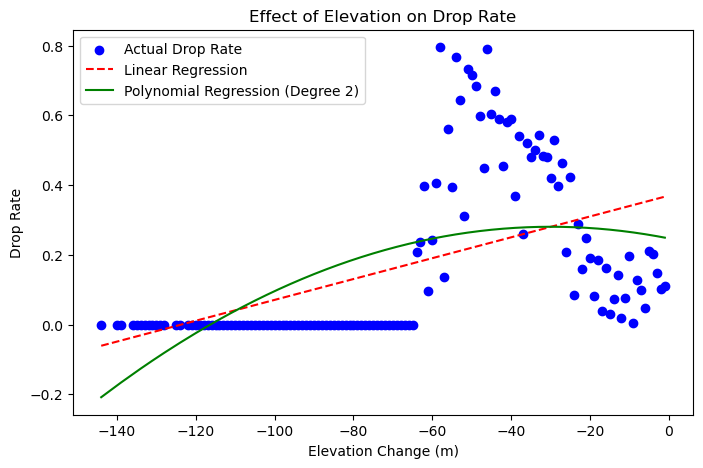

In [ ]:
uphill_df_grouped = data_uphill.groupby('elevation_change').agg(
    drop_rate=('was_dropped', 'mean')  # Mean of True/False gives the drop rate as a percentage
).reset_index()

# X = elevation change, y = drop rate
X = uphill_df_grouped[['elevation_change']]
y = uphill_df_grouped['drop_rate']

# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X, y)
y_pred_linear = linear_model.predict(X)

# Polynomial Regression (degree 2)
poly_model = make_pipeline(PolynomialFeatures(2), LinearRegression())
poly_model.fit(X, y)
y_pred_poly = poly_model.predict(X)

# Plot Results
plt.figure(figsize=(8, 5))
plt.scatter(X, y, color='blue', label='Actual Drop Rate')
plt.plot(X, y_pred_linear, color='red', linestyle='--', label='Linear Regression')
plt.plot(X, y_pred_poly, color='green', label='Polynomial Regression (Degree 2)')
plt.xlabel("Elevation Change (m)")
plt.ylabel("Drop Rate")
plt.title("Effect of Elevation on Drop Rate")
plt.legend()
plt.show()

In [ ]:
data[data['elevation_change'] < -140][['end_lat','end_lng']]

,end_lat,end_lng
8331300,38.915246,-77.220157


In [ ]:
bike_weather

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,Casual,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
4,DA46A05139C0EA2F,classic_bike,2021-01-01 00:17:46,2021-01-01 00:21:00,11th & Park Rd NW,31651.0,14th & Newton St NW,31649.0,38.931322,-77.028247,...,371,590,961,-0.9,2.3,63,10.6,2021,1,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693410,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693411,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693412,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter
10693413,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,...,2839,4488,7327,-8.9,-4.6,0,10.2,2023,12,Winter


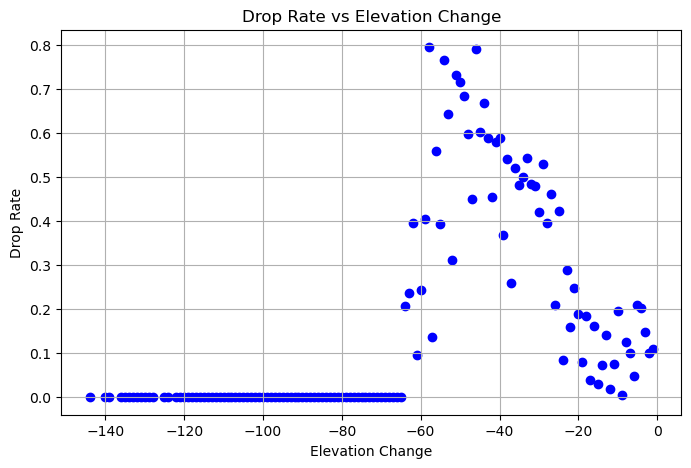

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'uphill_df_grouped' is already created
plt.figure(figsize=(8, 5))
plt.scatter(uphill_df_grouped['elevation_change'], uphill_df_grouped['drop_rate'], color='blue')
plt.xlabel('Elevation Change')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs Elevation Change')
plt.grid(True)
plt.show()


In [ ]:
bike_weather.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'was_dropped', 'elevation', 'start_elevation',
       'end_elevation', 'elevation_change', 'start_elevation_label',
       'end_elevation_label', 'trip_duration', 'trip_duration_minutes', 'Date',
       'Casual', 'Member', 'Total_rides', 'apparent_temperature_mean (°C)',
       'temperature_2m_mean (°C)', 'weathercode (wmo code)',
       'windspeed_10m_max (km/h)', 'year', 'month', 'season'],
      dtype='object')

In [ ]:
# Check correlation between drop_rate and weather variables in your DataFrame
weather_columns = ['apparent_temperature_mean (°C)', 'temperature_2m_mean (°C)', 'weathercode (wmo code)', 'windspeed_10m_max (km/h)']
weather_data = bike_weather[['was_dropped'] + weather_columns]

# Calculate drop rate per weather condition (group by weather variables)
weather_grouped = weather_data.groupby(weather_columns).agg(
    drop_rate=('was_dropped', 'mean'),  # Mean gives drop rate
    total_rides=('was_dropped', 'count')  # Total number of rides in that condition
).reset_index()

# Calculate correlations between weather data and drop rate
correlation = weather_data.corr()
print(correlation)


                                was_dropped  apparent_temperature_mean (°C)  \
was_dropped                        1.000000                       -0.028059   
apparent_temperature_mean (°C)    -0.028059                        1.000000   
temperature_2m_mean (°C)          -0.021605                        0.982507   
weathercode (wmo code)            -0.021598                        0.206272   
windspeed_10m_max (km/h)           0.007714                       -0.054227   

                                temperature_2m_mean (°C)  \
was_dropped                                    -0.021605   
apparent_temperature_mean (°C)                  0.982507   
temperature_2m_mean (°C)                        1.000000   
weathercode (wmo code)                          0.130467   
windspeed_10m_max (km/h)                        0.063678   

                                weathercode (wmo code)  \
was_dropped                                  -0.021598   
apparent_temperature_mean (°C)                0.

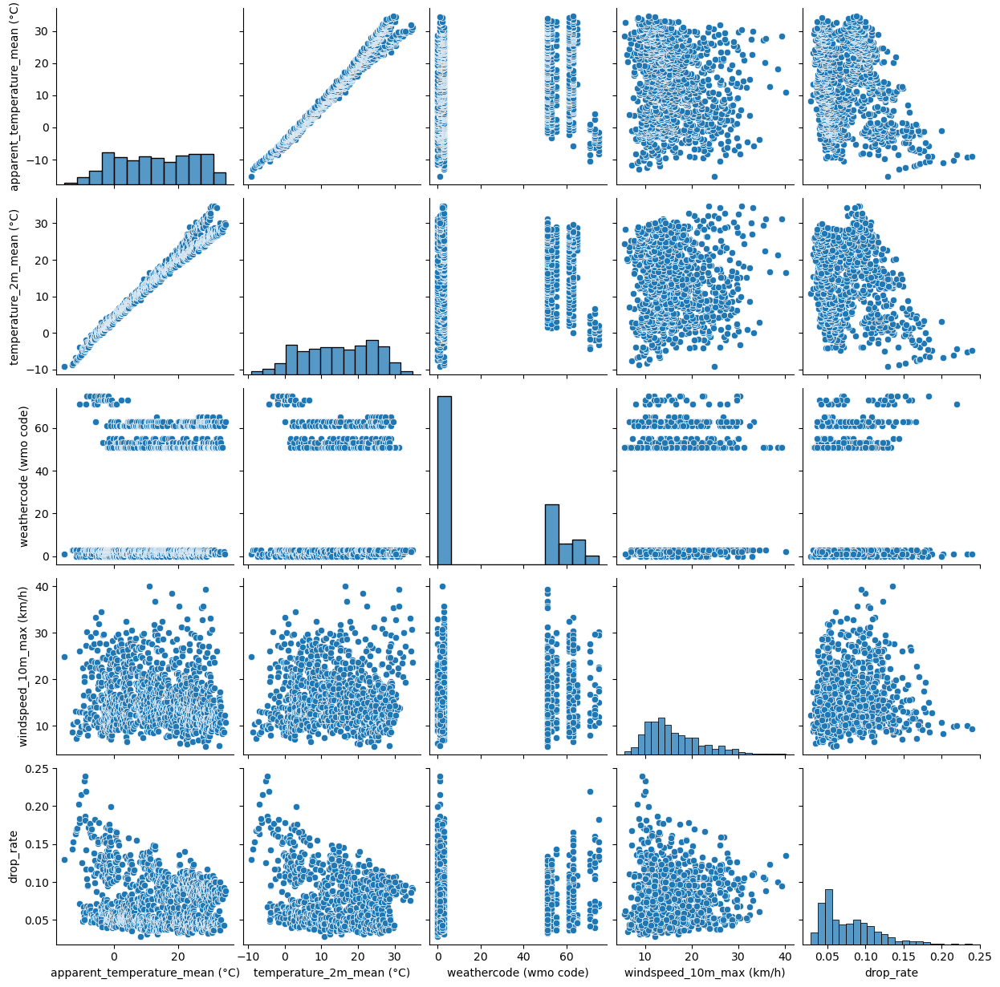

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot drop rate vs weather variables (you can select relevant columns)
sns.pairplot(weather_grouped, vars=weather_columns + ['drop_rate'])
plt.show()


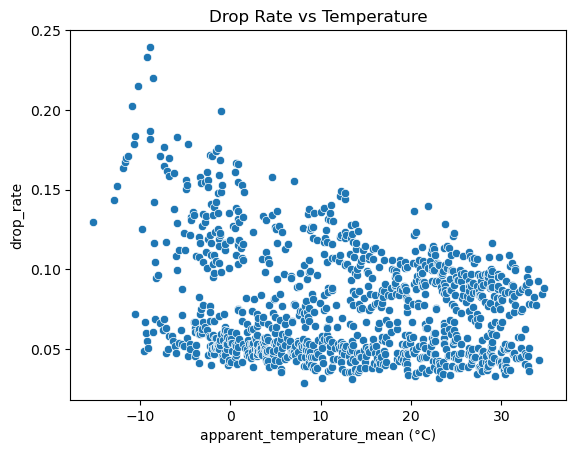

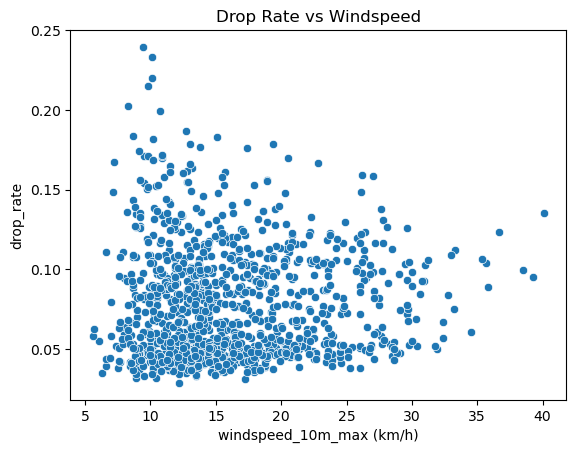

In [ ]:
# Plot drop rate against temperature
sns.scatterplot(data=weather_grouped, x='apparent_temperature_mean (°C)', y='drop_rate')
plt.title('Drop Rate vs Temperature')
plt.show()

# Plot drop rate against windspeed
sns.scatterplot(data=weather_grouped, x='windspeed_10m_max (km/h)', y='drop_rate')
plt.title('Drop Rate vs Windspeed')
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression

# Define predictors (weather-related variables)
X_weather = weather_data[['apparent_temperature_mean (°C)', 'temperature_2m_mean (°C)', 'windspeed_10m_max (km/h)']]

# Target variable: was_dropped (whether the bike was dropped)
y_weather = weather_data['was_dropped']

# Linear regression model
model = LinearRegression()
model.fit(X_weather, y_weather)

# Print the coefficients to understand the influence of each weather variable
print("Model Coefficients:", model.coef_)

# Predict drop rate using the model
y_pred = model.predict(X_weather)


Model Coefficients: [-0.00671197  0.00743659 -0.00103691]


In [ ]:
# One-hot encoding for weather_code if it's categorical
weather_data = pd.get_dummies(weather_data, columns=['weathercode (wmo code)'], drop_first=True)


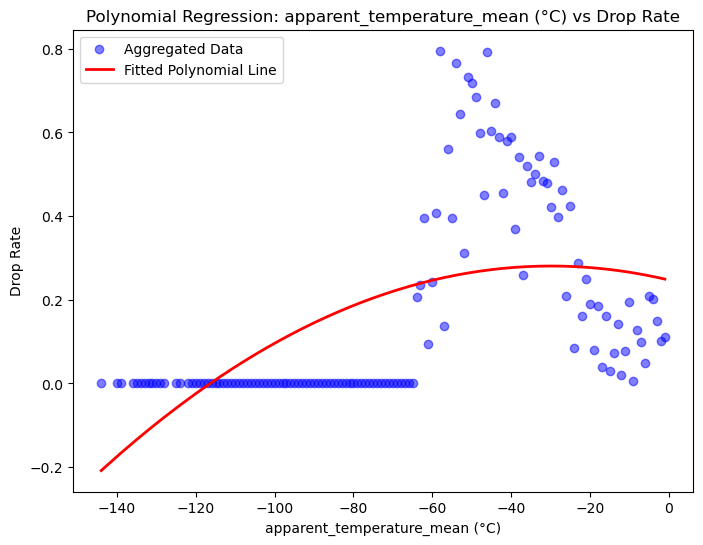

Intercept: 0.24702155381567423
Coefficients: [ 0.00000000e+00 -2.24078694e-03 -3.75172462e-05]
R² Score: 0.316590810486694


In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures

# Transform the features into polynomial features (e.g., square, cubic)
poly = PolynomialFeatures(degree=2)  # Change degree for higher polynomial
X_poly = poly.fit_transform(X)

# Initialize the linear regression model
model = LinearRegression()

# Fit the model to the polynomial features
model.fit(X_poly, y)

# Step 3: Visualize the Results
# Plot the aggregated data and the fitted polynomial regression line
plt.figure(figsize=(8, 6))
plt.scatter(X, y, color='blue', alpha=0.5, label='Aggregated Data')  # scatter plot for aggregated data
plt.plot(X, model.predict(X_poly), color='red', linewidth=2, label='Fitted Polynomial Line')  # polynomial regression line
plt.xlabel('apparent_temperature_mean (°C)')
plt.ylabel('Drop Rate')
plt.title('Polynomial Regression: apparent_temperature_mean (°C) vs Drop Rate')
plt.legend()
plt.show()

# Step 4: Print the model's coefficients
print(f"Intercept: {model.intercept_}")
print(f"Coefficients: {model.coef_}")
print(f"R² Score: {r2_score(y, model.predict(X_poly))}")


In [ ]:
data = data[(data['trip_duration_minutes'] > 3) & (data['trip_duration_minutes'] < 500)]

In [ ]:
data[['trip_duration_minutes', 'elevation_change']].corr()

,trip_duration_minutes,elevation_change
trip_duration_minutes,1.000000,-0.010826
elevation_change,-0.010826,1.000000


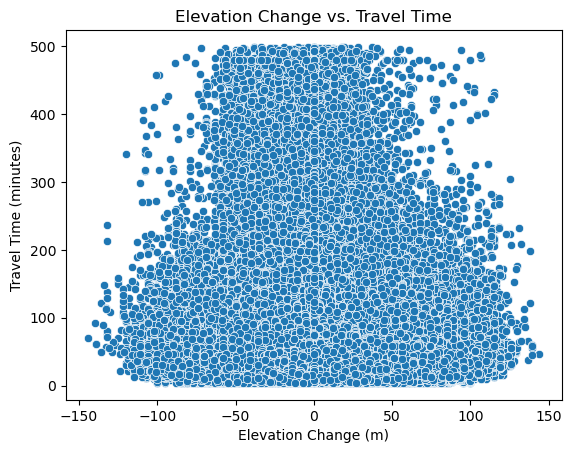

In [ ]:
sns.scatterplot(x=data['elevation_change'], y=data['trip_duration_minutes'])  
plt.xlabel('Elevation Change (m)')  
plt.ylabel('Travel Time (minutes)')  
plt.title('Elevation Change vs. Travel Time')  
plt.show()

In [ ]:
# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import r2_score
# from sklearn.model_selection import train_test_split

# X = data[['elevation_change']]
# y = data['trip_duration_minutes']

# # Split data into train and test sets (80% train, 20% test)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# 
# poly = PolynomialFeatures(degree=2)
# X_train_poly = poly.fit_transform(X_train)
# X_test_poly = poly.transform(X_test)

# model = LinearRegression()
# model.fit(X_train_poly,y_train)

# y_pred = model.predict(X_test_poly)

# r2 = r2_score(y_test,y_pred)

# # Print results
# print("Intercept:", model.intercept_)
# print("Coefficients:", model.coef_)
# print("R² Score:", r2)


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Generate predictions from the polynomial model for plotting
# X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)  # Generate a smooth range of values for X
# X_range_poly = poly.transform(X_range)  # Apply polynomial transformation
# y_range_pred = model.predict(X_range_poly)  # Get predicted values

# # Plotting the original data and the polynomial regression curve
# plt.figure(figsize=(8, 6))
# plt.scatter(X, y, color='blue', label='Data Points')  # Plot the original data
# plt.plot(X_range, y_range_pred, color='red', label='Polynomial Fit')  # Plot the polynomial fit
# plt.title('Polynomial Regression: Elevation Change vs. Time Traveled')
# plt.xlabel('Elevation Change')
# plt.ylabel('Time Traveled')
# plt.legend()
# plt.grid(True)
# plt.show()


In [ ]:
# # Transform the features into polynomial features (e.g., square, cubic)
# poly = PolynomialFeatures(degree=2)  # Change degree for higher polynomial
# X_poly = poly.fit_transform(X)

# # Initialize the linear regression model
# model = LinearRegression()

# # Fit the model to the polynomial features
# model.fit(X_poly, y)

# # Step 3: Visualize the Results
# # Plot the aggregated data and the fitted polynomial regression line
# plt.figure(figsize=(8, 6))
# # plt.scatter(X, y, color='blue', alpha=0.5, label='Aggregated Data')  # scatter plot for aggregated data
# plt.plot(X, model.predict(poly.fit_transform(X)), color='red', linewidth=2, label='Fitted Polynomial Line')  # polynomial regression line
# plt.xlabel('apparent_temperature_mean (°C)')
# plt.ylabel('Drop Rate')
# plt.title('Polynomial Regression: apparent_temperature_mean (°C) vs Drop Rate')
# plt.legend()
# plt.show()

# # Step 4: Print the model's coefficients
# # print(f"Intercept: {model.intercept_}")
# print(f"Coefficients: {model.coef_}")

In [ ]:
data[['trip_duration_minutes', 'elevation_change']].isnull().sum()


trip_duration_minutes       0
elevation_change         9629
dtype: int64

In [ ]:
data['elevation_bin'] = pd.cut(data['elevation_change'], bins)
print(data['elevation_bin'].value_counts())


elevation_bin
(-inf, 0.0]     5145714
(0.0, 10.0]     2071253
(10.0, 20.0]    1177980
(30.0, inf]      696376
(20.0, 30.0]     666385
Name: count, dtype: int64


In [ ]:
print(data['was_dropped'].unique())

[False  True]


In [ ]:
print((data['was_dropped'] == True).sum())  # Count True values


655679


In [ ]:
drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()
print(drop_rates)


elevation_bin
(-inf, 0.0]     0.112751
(0.0, 10.0]     0.017956
(10.0, 20.0]    0.008279
(20.0, 30.0]    0.012751
(30.0, inf]     0.028658
Name: was_dropped, dtype: float64


D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\545667753.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()


D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\2253009990.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()


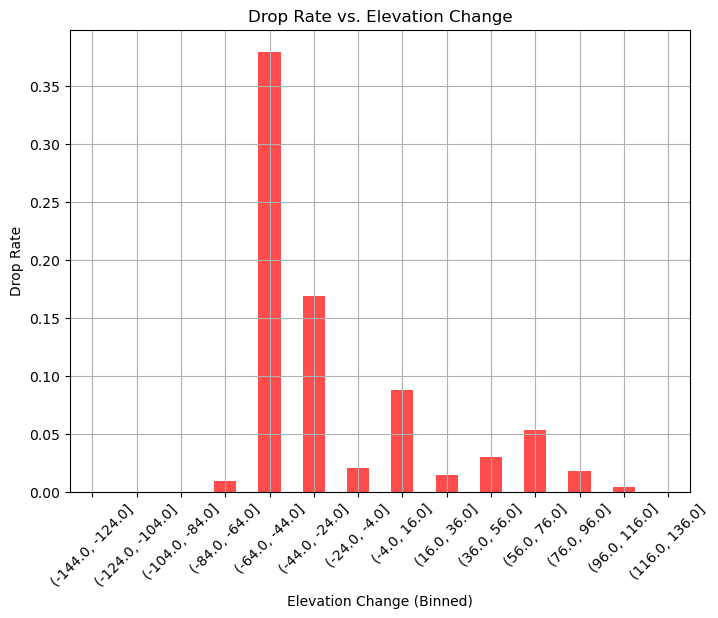

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define bins for elevation ranges
bins = np.arange(data['elevation_change'].min(), data['elevation_change'].max(), 20)  # Every 20m
data['elevation_bin'] = pd.cut(data['elevation_change'], bins)

# Calculate drop rate for each elevation bin
drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()

# Plot results
plt.figure(figsize=(8, 6))
drop_rates.plot(kind='bar', color='red', alpha=0.7)
plt.xlabel('Elevation Change (Binned)')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs. Elevation Change')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [ ]:
data

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,elevation,start_elevation,end_elevation,elevation_change,start_elevation_label,end_elevation_label,trip_duration,trip_duration_minutes,Date,elevation_bin
0,5CB9DFCECF79AF84,classic_bike,2021-01-01 00:08:33,2021-01-01 00:33:53,Maine Ave & 9th St SW,31646.0,Rosslyn Metro / Wilson Blvd & Ft Myer Dr,31015.0,38.880440,-77.025236,...,NaN,3.0,51.0,-48.0,low,medium,0 days 00:25:20,25.0,2021-01-01,"(-64.0, -44.0]"
1,629E059504606547,electric_bike,2021-01-01 00:13:43,2021-01-01 00:29:34,10th & U St NW,31111.0,NaN,NaN,38.917193,-77.025894,...,NaN,31.0,61.0,-30.0,medium,medium,0 days 00:15:51,16.0,2021-01-01,"(-44.0, -24.0]"
2,E74069873161EE33,electric_bike,2021-01-01 00:14:32,2021-01-01 00:28:45,17th & Corcoran St NW,31214.0,14th & Belmont St NW,31119.0,38.912138,-77.038568,...,NaN,29.0,51.0,-22.0,medium,medium,0 days 00:14:13,14.0,2021-01-01,"(-24.0, -4.0]"
3,91F95E512CABC46A,classic_bike,2021-01-01 00:15:45,2021-01-01 00:21:20,Wilson Blvd. & N. Vermont St.,31926.0,Wilson Blvd. & N. Vermont St.,31926.0,38.879477,-77.114563,...,NaN,82.0,82.0,0.0,high,high,0 days 00:05:35,6.0,2021-01-01,"(-4.0, 16.0]"
5,0FD3B4B2152425C3,electric_bike,2021-01-01 00:18:16,2021-01-01 00:29:05,NaN,NaN,Georgia Ave & Kennedy St NW,31415.0,38.930000,-77.030000,...,NaN,61.0,77.0,-16.0,medium,high,0 days 00:10:49,11.0,2021-01-01,"(-24.0, -4.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10693992,1E69FA72F720F2E7,classic_bike,2023-12-31 23:58:06,2024-01-01 00:12:29,King St & Peyton St,31955.0,Market Square / King St & Royal St,31042.0,38.806002,-77.055911,...,NaN,11.0,16.0,-5.0,low,low,0 days 00:14:23,14.0,2023-12-31,"(-24.0, -4.0]"
10693993,BA9E9FDBFAFDE618,electric_bike,2023-12-31 23:58:27,2024-01-01 00:02:28,Eastern Market Metro / Pennsylvania Ave & 8th ...,31613.0,Lincoln Park / 13th & East Capitol St NE,31619.0,38.884185,-76.995396,...,NaN,21.0,28.0,-7.0,medium,medium,0 days 00:04:01,4.0,2023-12-31,"(-24.0, -4.0]"
10693994,F3B6C6BFB1F738D0,classic_bike,2023-12-31 23:59:27,2024-01-01 02:09:11,22nd & P ST NW,31285.0,23rd & E St NW,31260.0,38.909394,-77.048728,...,NaN,20.0,23.0,-3.0,medium,medium,0 days 02:09:44,130.0,2023-12-31,"(-4.0, 16.0]"
10693995,D2DB18DB58BC83D2,classic_bike,2023-12-31 23:59:30,2024-01-01 02:02:07,22nd & P ST NW,31285.0,22nd & P ST NW,31285.0,38.909394,-77.048728,...,NaN,20.0,20.0,0.0,medium,medium,0 days 02:02:37,123.0,2023-12-31,"(-4.0, 16.0]"


In [ ]:
data['is_weekend'] = data['started_at'].dt.weekday >= 5  # Saturday (5) & Sunday (6) are weekends
data['is_weekend'] = data['is_weekend'].astype(int)  # Convert to 0 or 1

In [ ]:
weather['date'] = pd.to_datetime(weather['Date']) 

In [ ]:
weather

,Casual,Date,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season,date
0,371,2021-01-01,590,961,-0.9,2.3,63,10.6,2021,1,Winter,2021-01-01
1,2874,2021-01-02,2844,5718,4.8,7.6,61,19.1,2021,1,Winter,2021-01-02
2,495,2021-01-03,1133,1628,0.9,3.9,63,13.0,2021,1,Winter,2021-01-03
3,907,2021-01-04,2074,2981,1.0,4.1,3,13.3,2021,1,Winter,2021-01-04
4,1057,2021-01-05,2004,3061,1.4,4.0,51,9.2,2021,1,Winter,2021-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...
1090,646,2023-12-27,1934,2580,-8.6,-4.3,71,10.1,2023,12,Winter,2023-12-27
1091,3099,2023-12-28,4819,7918,-7.0,-2.5,0,12.8,2023,12,Winter,2023-12-28
1092,3491,2023-12-29,5168,8659,-7.8,-3.9,1,9.5,2023,12,Winter,2023-12-29
1093,3097,2023-12-30,4497,7594,-7.3,-2.9,1,13.8,2023,12,Winter,2023-12-30


In [ ]:
data['date'] = pd.to_datetime(data['started_at']).dt.date  # Extract only the date part
data['date'] = pd.to_datetime(data['date'])  # Convert to datetime format


In [ ]:
data = data.merge(weather[['date', 'apparent_temperature_mean (°C)', 'windspeed_10m_max (km/h)']], on='date', how='inner')


D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\3890795046.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()


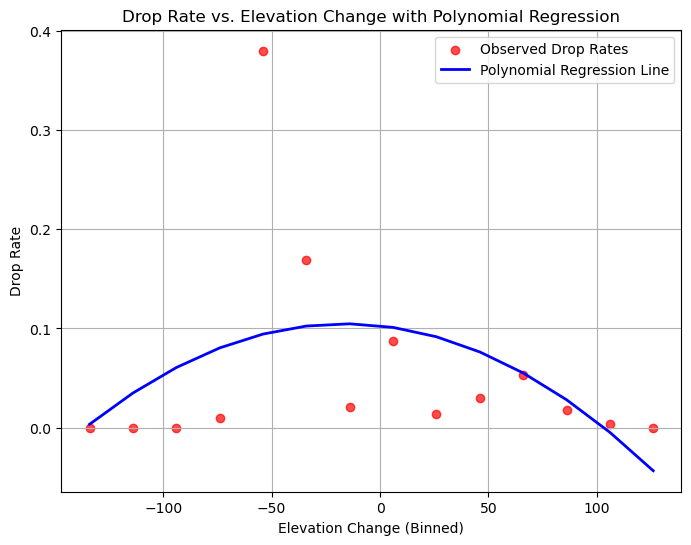

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Define bins for elevation ranges
bins = np.arange(data['elevation_change'].min(), data['elevation_change'].max(), 20)  # Every 20m
data['elevation_bin'] = pd.cut(data['elevation_change'], bins)

# Calculate drop rate for each elevation bin
drop_rates = data.groupby('elevation_bin')['was_dropped'].mean()

# Convert bin labels to numeric values for regression (taking the mid-value of each bin)
elevation_bin_labels = np.array([interval.mid for interval in drop_rates.index])
drop_rate_values = drop_rates.values

# Fit a polynomial regression model (degree 2 for quadratic)
poly = PolynomialFeatures(degree=2)
elevation_bin_labels_poly = poly.fit_transform(elevation_bin_labels.reshape(-1, 1))

# Perform linear regression
model = LinearRegression()
model.fit(elevation_bin_labels_poly, drop_rate_values)

# Predict using the polynomial regression model
predicted_drop_rates = model.predict(elevation_bin_labels_poly)

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(elevation_bin_labels, drop_rate_values, color='red', alpha=0.7, label='Observed Drop Rates')
plt.plot(elevation_bin_labels, predicted_drop_rates, color='blue', label='Polynomial Regression Line', linewidth=2)
plt.xlabel('Elevation Change (Binned)')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs. Elevation Change with Polynomial Regression')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
data = data.dropna(subset = ['elevation_change'])

In [ ]:

# Count number of trips for each elevation change
trip_counts = data.groupby('elevation_change').size().reset_index(name='trip_count')

# Remove rows where trip_count is less than 10
trip_counts = trip_counts[trip_counts['trip_count'] >= 10]

# Display the result
print(trip_counts)


     elevation_change  trip_count
18             -120.0          12
19             -119.0          10
20             -118.0          13
22             -116.0          12
23             -115.0          47
..                ...         ...
257             119.0          79
258             120.0          26
259             121.0          12
261             123.0          13
264             126.0          12

[243 rows x 2 columns]


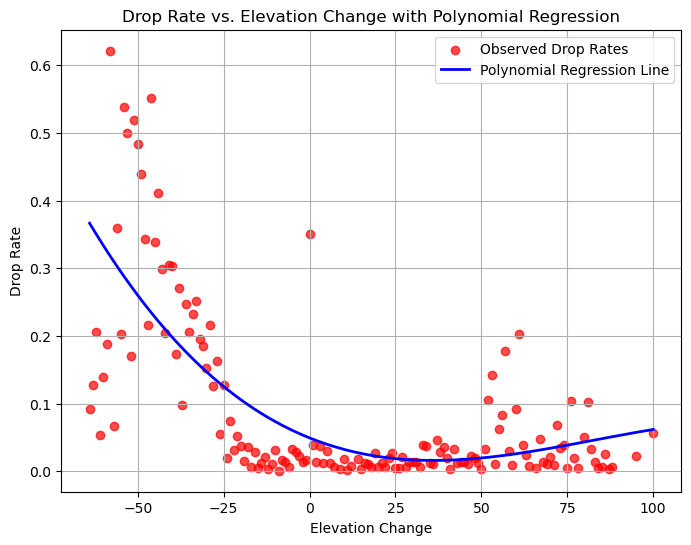

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Remove NaN values from elevation_change
data_filtered = data.dropna(subset=['elevation_change'])

# Count number of trips for each elevation change
trip_counts = data_filtered.groupby('elevation_change').size().reset_index(name='trip_count')

# Remove rows where trip_count is less than 10
trip_counts = trip_counts[trip_counts['trip_count'] >= 10]

# Get the filtered elevation values
filtered_elevation_values = trip_counts['elevation_change'].values.reshape(-1, 1)

# Calculate drop rate for each remaining elevation change
drop_rates = data_filtered.groupby('elevation_change')['was_dropped'].mean().reset_index()

# Keep only elevation changes that passed the filtering step
drop_rates = drop_rates[drop_rates['elevation_change'].isin(trip_counts['elevation_change'])]
drop_rates = drop_rates[drop_rates['was_dropped'] > 0]

elevation_values = drop_rates['elevation_change'].values.reshape(-1, 1)
drop_rate_values = drop_rates['was_dropped'].values

# Fit a polynomial regression model (degree 2 for quadratic)
poly = PolynomialFeatures(degree=3)
elevation_values_poly = poly.fit_transform(elevation_values)

# Perform linear regression
model = LinearRegression()
model.fit(elevation_values_poly, drop_rate_values)

# Predict using the polynomial regression model
predicted_drop_rates = model.predict(elevation_values_poly)


# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(elevation_values, drop_rate_values, color='red', alpha=0.7, label='Observed Drop Rates')
plt.plot(elevation_values, predicted_drop_rates, color='blue', label='Polynomial Regression Line', linewidth=2)
plt.xlabel('Elevation Change')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs. Elevation Change with Polynomial Regression')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
r2 = r2_score(drop_rate_values, predicted_drop_rates)
print(f'R² Score: {r2:.4f}')

R² Score: 0.5175


In [ ]:
# Remove NaN values from elevation_change
data_filtered = data.dropna(subset=['elevation_change'])

# Count number of trips for each elevation change
trip_counts = data_filtered.groupby('elevation_change').size().reset_index(name='trip_count')

# Display the result
print(trip_counts)


     elevation_change  trip_count
0              -144.0           1
1              -140.0           1
2              -139.0           2
3              -136.0           2
4              -135.0           1
..                ...         ...
272             135.0           1
273             137.0           2
274             138.0           2
275             139.0           4
276             144.0           1

[277 rows x 2 columns]


drop_rate vs windspeed

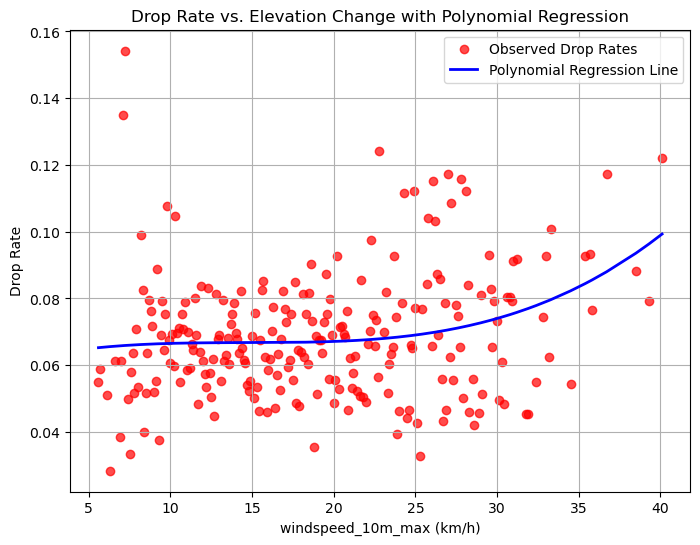

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Remove NaN values from elevation_change
data_filtered = data.dropna(subset=['windspeed_10m_max (km/h)'])

# Count number of trips for each elevation change
trip_counts = data_filtered.groupby('windspeed_10m_max (km/h)').size().reset_index(name='trip_count')

# Remove rows where trip_count is less than 10
trip_counts = trip_counts[trip_counts['trip_count'] >= 10]

# Get the filtered elevation values
filtered_elevation_values = trip_counts['windspeed_10m_max (km/h)'].values.reshape(-1, 1)

# Calculate drop rate for each remaining elevation change
drop_rates = data_filtered.groupby('windspeed_10m_max (km/h)')['was_dropped'].mean().reset_index()

# Keep only elevation changes that passed the filtering step
drop_rates = drop_rates[drop_rates['windspeed_10m_max (km/h)'].isin(trip_counts['windspeed_10m_max (km/h)'])]
drop_rates = drop_rates[drop_rates['was_dropped'] > 0]

elevation_values = drop_rates['windspeed_10m_max (km/h)'].values.reshape(-1, 1)
drop_rate_values = drop_rates['was_dropped'].values

# Fit a polynomial regression model (degree 2 for quadratic)
poly = PolynomialFeatures(degree=3)
elevation_values_poly = poly.fit_transform(elevation_values)

# Perform linear regression
model = LinearRegression()
model.fit(elevation_values_poly, drop_rate_values)

# Predict using the polynomial regression model
predicted_drop_rates = model.predict(elevation_values_poly)

# Calculate R² score
r2 = r2_score(drop_rate_values, predicted_drop_rates)
print(f"Polynomial Regression R²: {r2:.4f}")


# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(elevation_values, drop_rate_values, color='red', alpha=0.7, label='Observed Drop Rates')
plt.plot(elevation_values, predicted_drop_rates, color='blue', label='Polynomial Regression Line', linewidth=2)
plt.xlabel('windspeed_10m_max (km/h)')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs. Elevation Change with Polynomial Regression')
plt.legend()
plt.grid(True)
plt.show()


R² Score: 0.3030


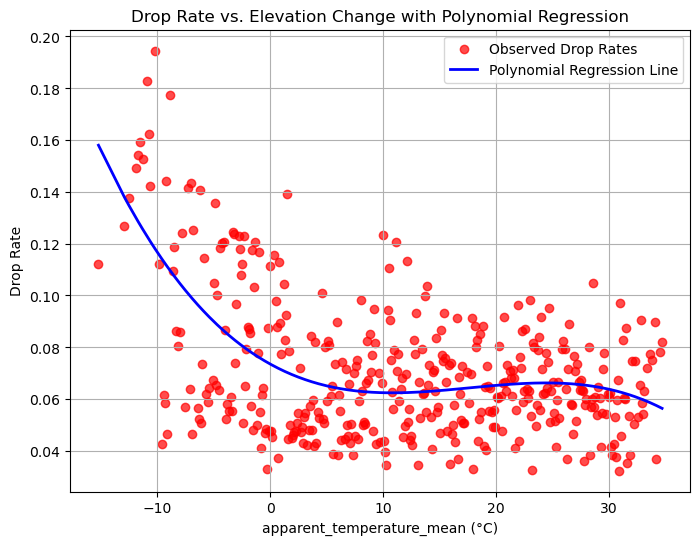

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Remove NaN values from elevation_change
data_filtered = data.dropna(subset=['apparent_temperature_mean (°C)'])

# Count number of trips for each elevation change
trip_counts = data_filtered.groupby('apparent_temperature_mean (°C)').size().reset_index(name='trip_count')

# Remove rows where trip_count is less than 10
# trip_counts = trip_counts[trip_counts['trip_count'] >= 10]

# Get the filtered elevation values
filtered_elevation_values = trip_counts['apparent_temperature_mean (°C)'].values.reshape(-1, 1)

# Calculate drop rate for each remaining elevation change
drop_rates = data_filtered.groupby('apparent_temperature_mean (°C)')['was_dropped'].mean().reset_index()

# Keep only elevation changes that passed the filtering step
drop_rates = drop_rates[drop_rates['apparent_temperature_mean (°C)'].isin(trip_counts['apparent_temperature_mean (°C)'])]
# drop_rates = drop_rates[drop_rates['was_dropped'] > 0]

elevation_values = drop_rates['apparent_temperature_mean (°C)'].values.reshape(-1, 1)
drop_rate_values = drop_rates['was_dropped'].values

# Fit a polynomial regression model (degree 2 for quadratic)
poly = PolynomialFeatures(degree=3)
elevation_values_poly = poly.fit_transform(elevation_values)

# Perform linear regression
model = LinearRegression()
model.fit(elevation_values_poly, drop_rate_values)

# Predict using the polynomial regression model
predicted_drop_rates = model.predict(elevation_values_poly)

r2 = r2_score(drop_rate_values, predicted_drop_rates)
print(f'R² Score: {r2:.4f}')

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(elevation_values, drop_rate_values, color='red', alpha=0.7, label='Observed Drop Rates')
plt.plot(elevation_values, predicted_drop_rates, color='blue', label='Polynomial Regression Line', linewidth=2)
plt.xlabel('apparent_temperature_mean (°C)')
plt.ylabel('Drop Rate')
plt.title('Drop Rate vs. Elevation Change with Polynomial Regression')
plt.legend()
plt.grid(True)
plt.show()


Poly Regression Number of Rides vs Temp

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
data_daily = data.groupby('date').size().reset_index(name = 'number_of_rides')

In [ ]:
data_daily.columns

Index(['date', 'number_of_rides'], dtype='object')

In [ ]:
# Assuming df contains the windspeed data, and df_daily has the number_of_rides
data_weather = pd.merge(data_daily, data[['date', 'windspeed_10m_max (km/h)']], on="date", how="inner")


In [ ]:
X = data_weather[['windspeed_10m_max (km/h)']].values
y = data_weather['number_of_rides'].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

In [ ]:
model = LinearRegression()
model.fit(X_train_poly, y_train)

LinearRegression()

In [ ]:
y_pred = model.predict(X_test_poly)

In [ ]:
r2 = r2_score(y_test, y_pred)
print(f"Polynomial Regression R²: {r2:.4f}")

Polynomial Regression R²: 0.0035


d:\Users\Olunia\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


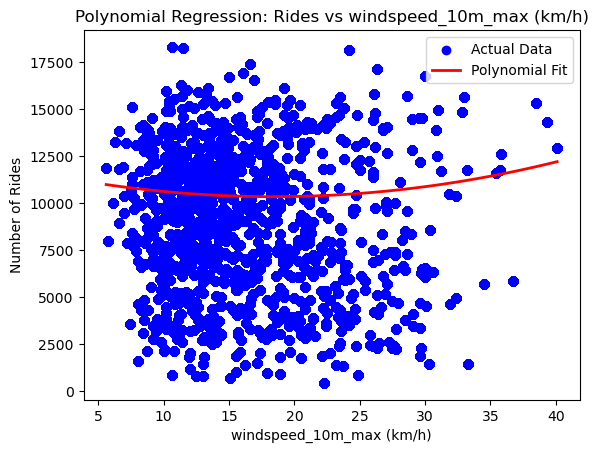

In [ ]:
plt.scatter(X, y, color="blue", label="Actual Data")
X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)  # Smooth curve
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)
plt.plot(X_range, y_range_pred, color="red", linewidth=2, label="Polynomial Fit")
plt.xlabel("windspeed_10m_max (km/h)")
plt.ylabel("Number of Rides")
plt.legend()
plt.title("Polynomial Regression: Rides vs windspeed_10m_max (km/h)")
plt.show()

Time/Distance vs Weather Conditions/Elevation

In [ ]:
data_weather

,date,number_of_rides,windspeed_10m_max (km/h)
0,2021-01-01,847,10.6
1,2021-01-01,847,10.6
2,2021-01-01,847,10.6
3,2021-01-01,847,10.6
4,2021-01-01,847,10.6
...,...,...,...
9757703,2023-12-31,6304,10.2
9757704,2023-12-31,6304,10.2
9757705,2023-12-31,6304,10.2
9757706,2023-12-31,6304,10.2


In [ ]:
bad_weather_codes = [45, 48, 51, 52, 53, 55, 56, 57, 61, 63, 65, 66, 67, 71, 73, 75, 80, 81, 82, 85, 86, 95, 96, 99]
bad_weather = weather[weather['weathercode (wmo code)'].isin(bad_weather_codes)]
bad_weather

,Casual,Date,Member,Total_rides,apparent_temperature_mean (°C),temperature_2m_mean (°C),weathercode (wmo code),windspeed_10m_max (km/h),year,month,season,date
0,371,2021-01-01,590,961,-0.9,2.3,63,10.6,2021,1,Winter,2021-01-01
1,2874,2021-01-02,2844,5718,4.8,7.6,61,19.1,2021,1,Winter,2021-01-02
2,495,2021-01-03,1133,1628,0.9,3.9,63,13.0,2021,1,Winter,2021-01-03
4,1057,2021-01-05,2004,3061,1.4,4.0,51,9.2,2021,1,Winter,2021-01-05
14,924,2021-01-15,2410,3334,1.0,4.4,53,18.9,2021,1,Winter,2021-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...
994,5666,2023-09-22,10404,16070,12.9,16.4,61,29.5,2023,9,Fall,2023-09-22
1000,5507,2023-09-28,11410,16917,15.8,18.7,51,20.4,2023,9,Fall,2023-09-28
1002,8444,2023-09-30,10264,18708,13.4,16.4,51,26.3,2023,9,Fall,2023-09-30
1042,4471,2023-11-09,10478,14949,3.6,7.7,51,12.3,2023,11,Fall,2023-11-09


In [ ]:
bike_weather.isna().sum()

ride_id                                  0
rideable_type                            0
started_at                               0
ended_at                                 0
start_station_name                  742374
start_station_id                    742374
end_station_name                    811227
end_station_id                      811227
start_lat                                2
start_lng                                2
end_lat                              16765
end_lng                              16765
member_casual                            0
was_dropped                              0
elevation                         10683359
start_elevation                       7317
end_elevation                         7322
elevation_change                     10081
start_elevation_label                    0
end_elevation_label                      0
trip_duration                            0
trip_duration_minutes                    0
Date                                     0
Casual     

In [ ]:
bike_weather = bike_weather.dropna(subset=['elevation_change'])

In [ ]:
bike_weather['elevation_change'].isna().sum()

0

In [ ]:
X = bike_weather[['apparent_temperature_mean (°C)', 'elevation_change']].values
y = bike_weather['trip_duration_minutes'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred = model.predict(X_test_poly)

r2 = r2_score(y_test, y_pred)
print(f"Polynomial Regression R²: {r2:.4f}")

Polynomial Regression R²: 0.0033


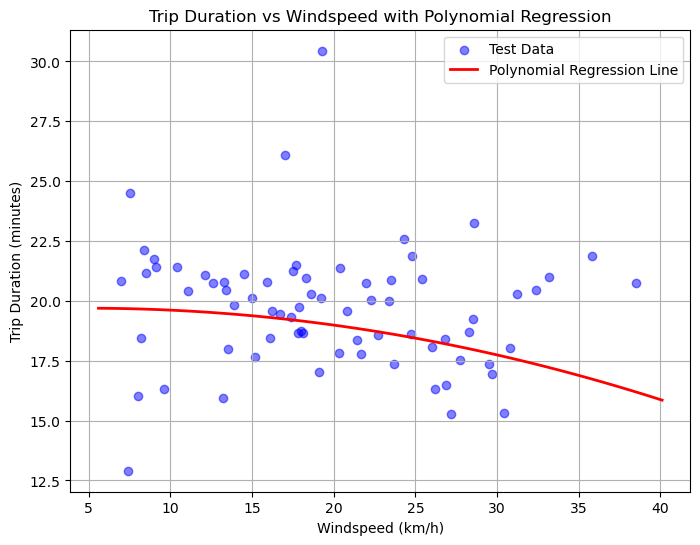

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression


bike_weather = bike_weather[(bike_weather['trip_duration_minutes'] > 3) & (bike_weather['trip_duration_minutes'] < 600)]
bike_weather_grouped = bike_weather.groupby('windspeed_10m_max (km/h)')['trip_duration_minutes'].mean().reset_index()
# Step 1: Prepare the data
X = bike_weather_grouped[['windspeed_10m_max (km/h)']].values
y = bike_weather_grouped['trip_duration_minutes'].values

# Step 2: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 3: Polynomial regression (degree 3)
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train the model using the training data
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Step 4: Predict using the polynomial regression model
y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Step 5: Plot the actual data points (scatter plot)
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

# Step 6: Plot the polynomial regression line
X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)  # Generate points for smooth curve
X_range_poly = poly.transform(X_range)  # Transform the new X range to match polynomial features
y_range_pred = model.predict(X_range_poly)  # Predict using the model

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

# Add labels and title
plt.title('Trip Duration vs Windspeed with Polynomial Regression')
plt.xlabel('Windspeed (km/h)')
plt.ylabel('Trip Duration (minutes)')
plt.legend()
plt.grid(True)
plt.show()


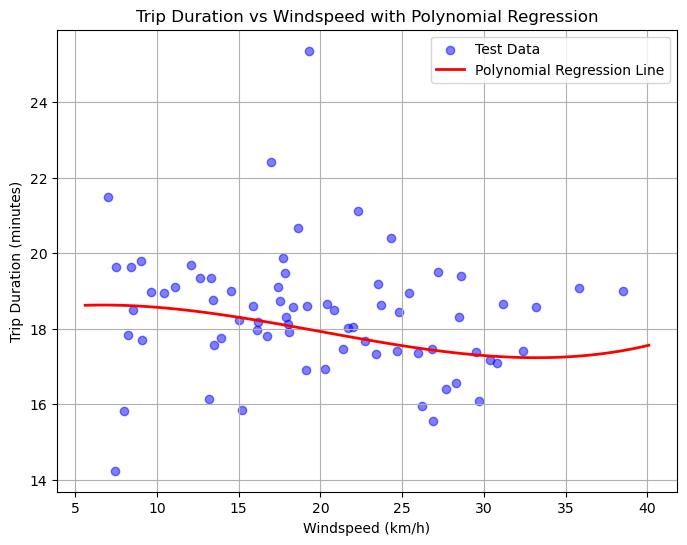

In [ ]:
# Apply the filter for electric bikes and members

# Then proceed with your previous steps:
bike_weather = bike_weather_electric[(bike_weather_electric['trip_duration_minutes'] > 3) & (bike_weather_electric['trip_duration_minutes'] < 600)]
bike_weather_grouped = bike_weather.groupby('windspeed_10m_max (km/h)')['trip_duration_minutes'].mean().reset_index()

# Continue with the model and plotting code as before
X = bike_weather_grouped[['windspeed_10m_max (km/h)']].values
y = bike_weather_grouped['trip_duration_minutes'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plotting the results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Trip Duration vs Windspeed with Polynomial Regression')
plt.xlabel('Windspeed (km/h)')
plt.ylabel('Trip Duration (minutes)')
plt.legend()
plt.grid(True)
plt.show()


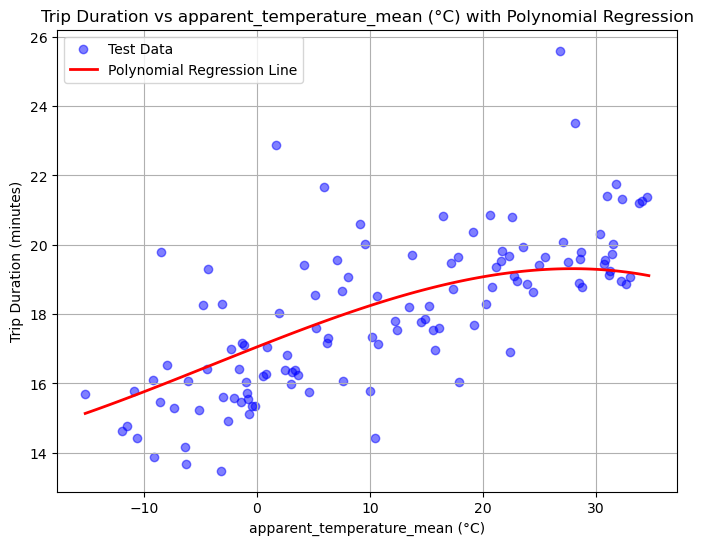

Polynomial Regression R²: 0.4650


In [ ]:
# Apply the filter for electric bikes and members

# Then proceed with your previous steps:
bike_weather = bike_weather_electric[(bike_weather_electric['trip_duration_minutes'] > 3)]
bike_weather_grouped = bike_weather.groupby('apparent_temperature_mean (°C)')['trip_duration_minutes'].mean().reset_index()

# Continue with the model and plotting code as before
X = bike_weather_grouped[['apparent_temperature_mean (°C)']].values
y = bike_weather_grouped['trip_duration_minutes'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plotting the results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Trip Duration vs apparent_temperature_mean (°C) with Polynomial Regression')
plt.xlabel('apparent_temperature_mean (°C)')
plt.ylabel('Trip Duration (minutes)')
plt.legend()
plt.grid(True)
plt.show()

# Calculate R² score
r2 = r2_score(y_test, y_pred_test)
print(f"Polynomial Regression R²: {r2:.4f}")


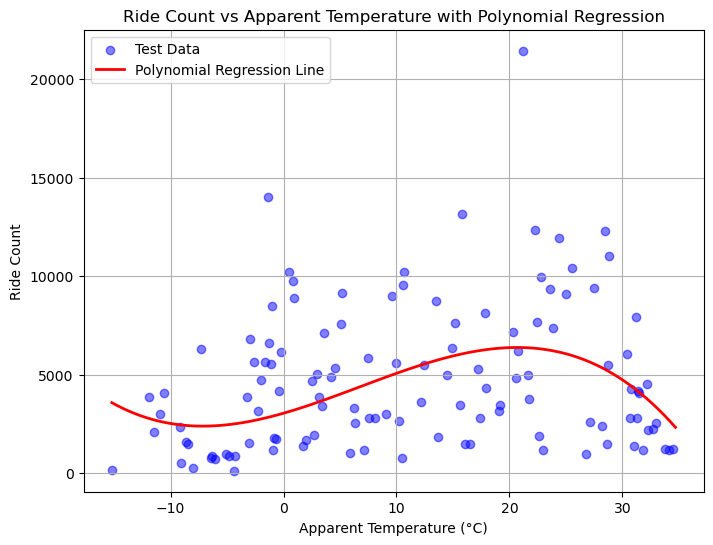

Polynomial Regression R²: 0.1176


In [ ]:
# Apply the filter for electric bikes and members
bike_weather_filtered = bike_weather_electric.copy()

# Count the number of rides per apparent temperature
bike_weather_grouped = bike_weather_filtered.groupby('apparent_temperature_mean (°C)')['started_at'].count().reset_index(name='ride_count')

# Prepare data for regression
X = bike_weather_grouped[['apparent_temperature_mean (°C)']].values
y = bike_weather_grouped['ride_count'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformation
poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train the model
model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Ride Count vs Apparent Temperature with Polynomial Regression')
plt.xlabel('Apparent Temperature (°C)')
plt.ylabel('Ride Count')
plt.legend()
plt.grid(True)
plt.show()

# Calculate R² score
r2 = r2_score(y_test, y_pred_test)
print(f"Polynomial Regression R²: {r2:.4f}")


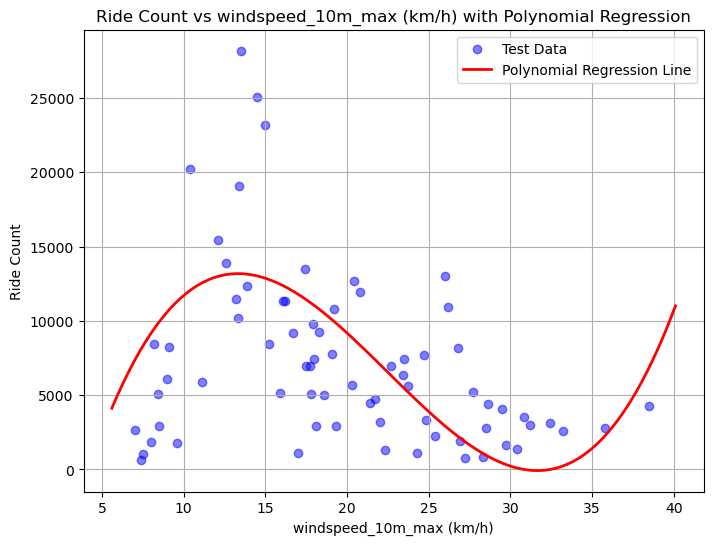

Polynomial Regression R²: 0.2252


In [ ]:
# Apply the filter for electric bikes and members
bike_weather_filtered = bike_weather_electric.copy()

# Count the number of rides per apparent temperature
bike_weather_grouped = bike_weather_filtered.groupby('windspeed_10m_max (km/h)')['started_at'].count().reset_index(name='ride_count')

# Prepare data for regression
X = bike_weather_grouped[['windspeed_10m_max (km/h)']].values
y = bike_weather_grouped['ride_count'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformation
poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train the model
model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Ride Count vs windspeed_10m_max (km/h) with Polynomial Regression')
plt.xlabel('windspeed_10m_max (km/h)')
plt.ylabel('Ride Count')
plt.legend()
plt.grid(True)
plt.show()

# Calculate R² score
r2 = r2_score(y_test, y_pred_test)
print(f"Polynomial Regression R²: {r2:.4f}")


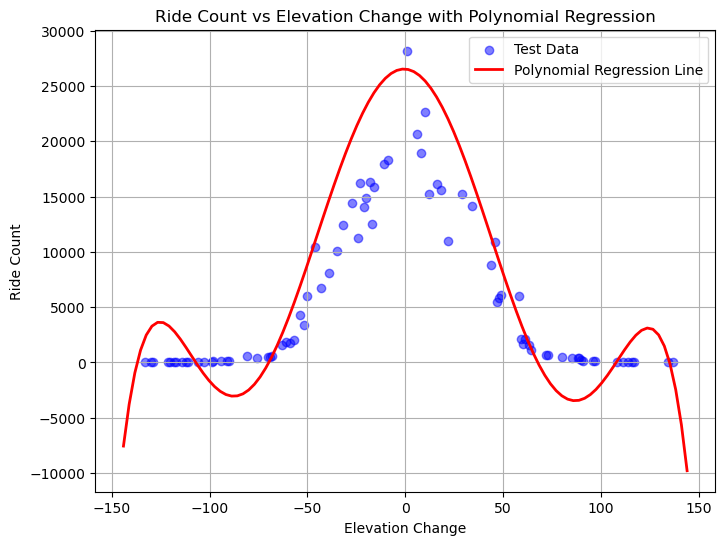

Polynomial Regression R²: 0.5961


In [ ]:
# Apply the filter for electric bikes and members
bike_weather_filtered = bike_weather_electric.copy()

# Count the number of rides per apparent temperature
bike_weather_grouped = bike_weather_filtered.groupby('elevation_change')['started_at'].count().reset_index(name='ride_count')

# Prepare data for regression
X = bike_weather_grouped[['elevation_change']].values
y = bike_weather_grouped['ride_count'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformation
poly = PolynomialFeatures(degree=6)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train the model
model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Ride Count vs Elevation Change with Polynomial Regression')
plt.xlabel('Elevation Change')
plt.ylabel('Ride Count')
plt.legend()
plt.grid(True)
plt.show()

# Calculate R² score
r2 = r2_score(y_test, y_pred_test)
print(f"Polynomial Regression R²: {r2:.4f}")

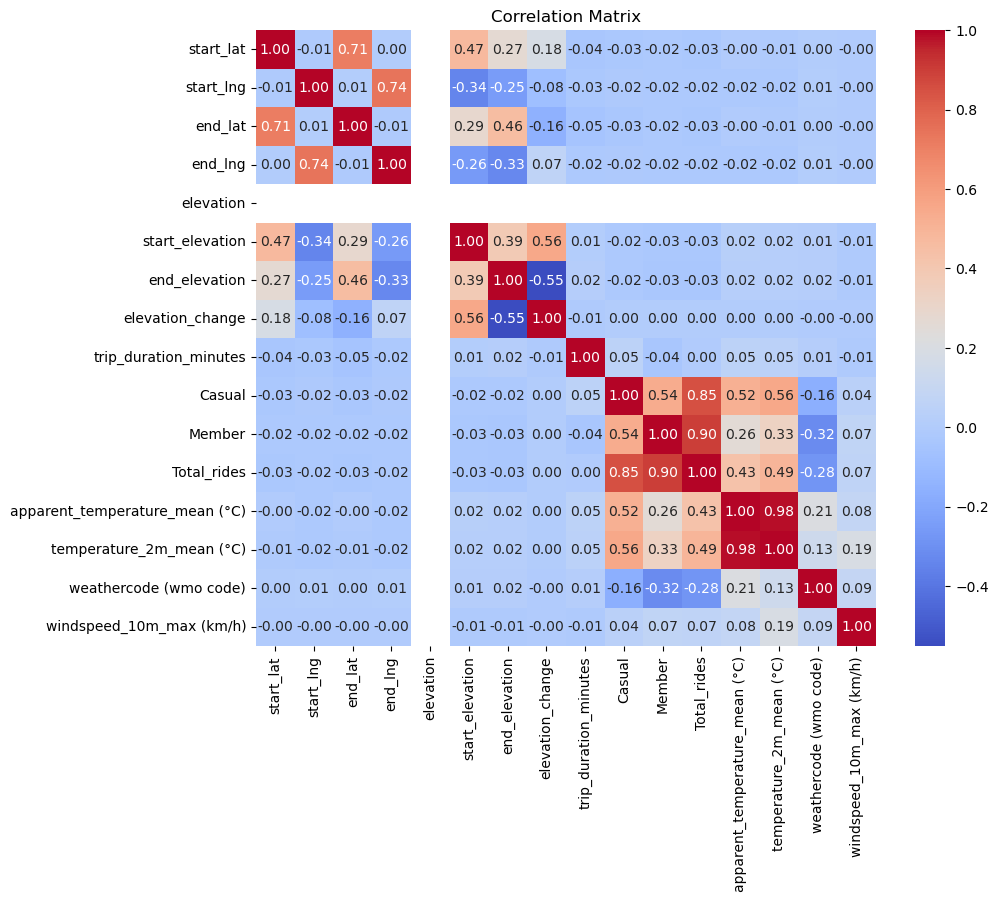

In [ ]:
# Select only numeric columns for correlation
numeric_cols = bike_weather_filtered.select_dtypes(include=['float64', 'int64']).columns

# Create a new DataFrame with only numeric columns
numeric_data = bike_weather_filtered[numeric_cols]

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'bike_weather_filtered'
# Calculate the correlation matrix
correlation_matrix = bike_weather_filtered.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of Features")
plt.show()


ValueError: could not convert string to float: 'E74069873161EE33'

In [ ]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(y_test, y_pred_test)
print(f"Mean Absolute Error (MAE): {mae:.4f}")


Mean Absolute Error (MAE): 3541.7932


In [ ]:
from sklearn.metrics import mean_squared_error

mean_squared_error(y_test, y_pred_test, squared=False)


d:\Users\Olunia\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


4489.015430168076

In [ ]:
mean_squared_error(y_test, y_pred_test)

20151259.532287076

In [ ]:
print(bike_weather.dtypes)

ride_id                                    object
rideable_type                              object
started_at                         datetime64[ns]
ended_at                           datetime64[ns]
start_station_name                         object
start_station_id                           object
end_station_name                           object
end_station_id                             object
start_lat                                 float64
start_lng                                 float64
end_lat                                   float64
end_lng                                   float64
member_casual                              object
was_dropped                                  bool
elevation                                 float64
start_elevation                           float64
end_elevation                             float64
elevation_change                          float64
start_elevation_label                      object
end_elevation_label                        object


In [ ]:
bike_weather = bike_weather.drop(columns=['ride_id', 'start_station_name', 'end_station_name'])


In [ ]:
# Apply One-Hot Encoding to categorical columns
bike_weather_encoded = pd.get_dummies(bike_weather, columns=['rideable_type', 'member_casual', 'season'], drop_first=True)


In [ ]:
# Check for missing values
print(bike_weather_encoded.isnull().sum())

# Check data types
print(bike_weather_encoded.dtypes)



started_at                              0
ended_at                                0
start_station_id                   545872
end_station_id                     557534
start_lat                               0
start_lng                               0
end_lat                                 0
end_lng                                 0
was_dropped                             0
elevation                         1872179
start_elevation                       479
end_elevation                         456
elevation_change                      935
start_elevation_label                   0
end_elevation_label                     0
trip_duration                           0
trip_duration_minutes                   0
Date                                    0
Casual                                  0
Member                                  0
Total_rides                             0
apparent_temperature_mean (°C)          0
temperature_2m_mean (°C)                0
weathercode (wmo code)            

In [ ]:
bike_weather_classic = bike_weather[bike_weather['rideable_type'] == 'classic']

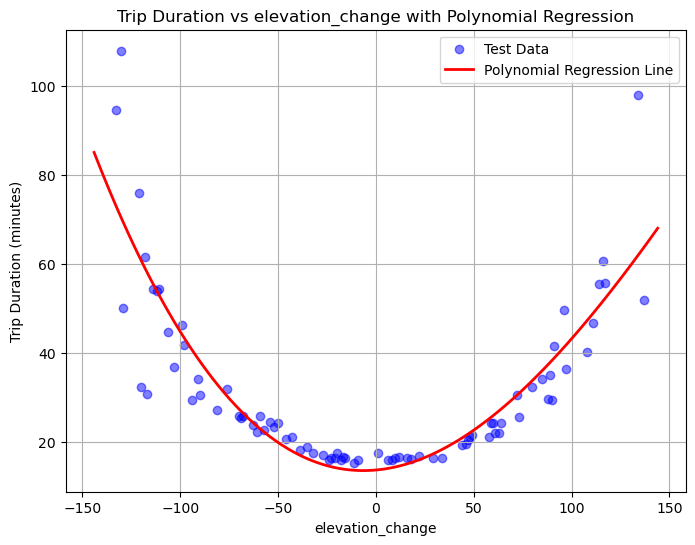

In [ ]:
# Apply the filter for electric bikes and members

# Then proceed with your previous steps:
bike_weather = bike_weather_electric[(bike_weather_electric['trip_duration_minutes'] > 3)]
bike_weather_grouped = bike_weather.groupby('elevation_change')['trip_duration_minutes'].mean().reset_index()

# Continue with the model and plotting code as before
X = bike_weather_grouped[['elevation_change']].values
y = bike_weather_grouped['trip_duration_minutes'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

poly = PolynomialFeatures(degree=3)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model = LinearRegression()
model.fit(X_train_poly, y_train)

y_pred_train = model.predict(X_train_poly)
y_pred_test = model.predict(X_test_poly)

# Plotting the results
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, alpha=0.5, color='blue', label='Test Data')

X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_range_pred = model.predict(X_range_poly)

plt.plot(X_range, y_range_pred, color='red', linewidth=2, label='Polynomial Regression Line')

plt.title('Trip Duration vs elevation_change with Polynomial Regression')
plt.xlabel('elevation_change')
plt.ylabel('Trip Duration (minutes)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
station_demand_electric

,start_station_name,rideable_type,starts,ends,net_demand,Supply_Status
44,Park Rd & Holmead Pl NW,electric_bike,12238.0,9652.0,2586.0,Undersupplied
54,11th & Kenyon St NW,electric_bike,12366.0,10228.0,2138.0,Undersupplied
65,14th & Otis Pl NW,electric_bike,9860.0,8187.0,1673.0,Undersupplied
74,14th & Irving St NW,electric_bike,18418.0,16914.0,1504.0,Undersupplied
76,Columbia Rd & Georgia Ave NW,electric_bike,9493.0,8027.0,1466.0,Undersupplied
...,...,...,...,...,...,...
2112,6035 Warehouse,electric_bike,50.0,91.0,-41.0,Oversupplied
2121,M St & Delaware Ave NE,electric_bike,5159.0,5203.0,-44.0,Oversupplied
2157,1st & I St SE,electric_bike,6311.0,6373.0,-62.0,Oversupplied
2159,3rd & M St SE,electric_bike,1734.0,1797.0,-63.0,Oversupplied


In [ ]:
[station_demand_electric['Supply_Status'] == 'Undersupplied']

[44       True
 54       True
 65       True
 74       True
 76       True
         ...  
 2112    False
 2121    False
 2157    False
 2159    False
 2199    False
 Name: Supply_Status, Length: 851, dtype: bool]

In [ ]:
# List of specific stations to filter by
specific_stations = ["14th & Irving St NW", "15th & P St NW", 'Adams Mill & Columbia Rd NW', 
                     'Lamont & Mt Pleasant NW', '37th & O St NW / Georgetown University', 
                     '14th & V St NW', '5th & K St NW', 'Massachusetts Ave & Dupont Circle NW']

# Filter the station_demand DataFrame for these stations
filtered_station_demand = station_demand_electric[station_demand_electric['start_station_name'].isin(specific_stations)]

# Display the filtered DataFrame
print(filtered_station_demand)


                         start_station_name  rideable_type   starts     ends  \
74                      14th & Irving St NW  electric_bike  18418.0  16914.0   
143                 Lamont & Mt Pleasant NW  electric_bike  15494.0  14847.0   
248             Adams Mill & Columbia Rd NW  electric_bike  16140.0  15880.0   
350                          14th & V St NW  electric_bike  12728.0  12583.0   
402    Massachusetts Ave & Dupont Circle NW  electric_bike  11530.0  11417.0   
422                           5th & K St NW  electric_bike  11009.0  10905.0   
444  37th & O St NW / Georgetown University  electric_bike  12517.0  12421.0   
517                          15th & P St NW  electric_bike  13517.0  13444.0   

     net_demand  Supply_Status  
74       1504.0  Undersupplied  
143       647.0  Undersupplied  
248       260.0  Undersupplied  
350       145.0  Undersupplied  
402       113.0  Undersupplied  
422       104.0  Undersupplied  
444        96.0  Undersupplied  
517        73.0

D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\3890551143.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(filtered_station_demand['start_station_name'], rotation=90, color='black')
D:\Users\Olunia\AppData\Local\Temp\ipykernel_10340\3890551143.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), color='black')


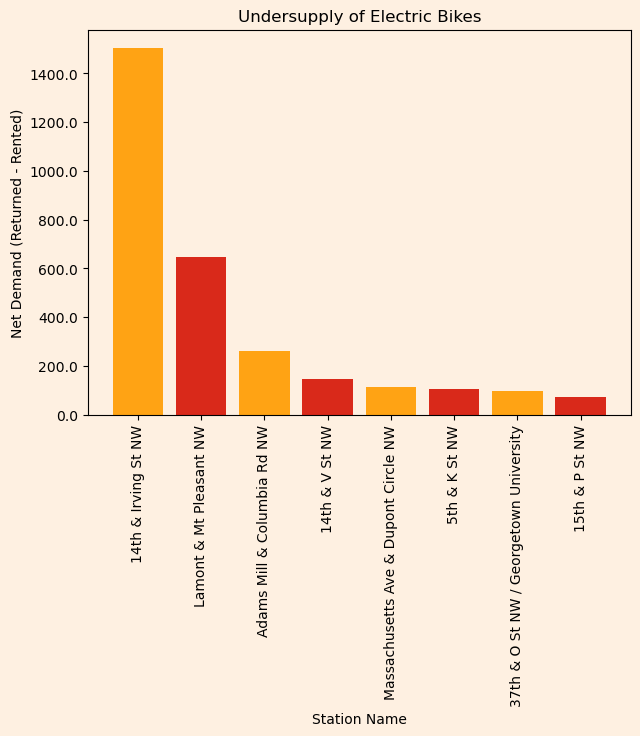

In [ ]:
import matplotlib.pyplot as plt

# Define colors
bar_colors = ['#FFA314', '#D9291A']  # Alternating Orange and Red
plot_background_color = '#FEF0E1'  # Light Peach

# Create figure with background color
fig, ax = plt.subplots(figsize=(7, 5))
fig.patch.set_facecolor(plot_background_color)  # Set background color for the entire figure

# Create bar plot with alternating colors
bars = ax.bar(filtered_station_demand['start_station_name'], 
              filtered_station_demand['net_demand'], 
              color=[bar_colors[i % 2] for i in range(len(filtered_station_demand))])

# Rotate x-axis labels for better readability
ax.set_xticklabels(filtered_station_demand['start_station_name'], rotation=90, color='black')
ax.set_yticklabels(ax.get_yticks(), color='black')

# Labels and title
ax.set_xlabel('Station Name', color='black')
ax.set_ylabel('Net Demand (Returned - Rented)', color='black')
ax.set_title('Undersupply of Electric Bikes', color='black')

# Set background color for the plot (inside axes)
ax.set_facecolor(plot_background_color)

# Show the plot
plt.show()



In [ ]:
# First, make sure 'started_at' and 'ended_at' are datetime objects
data['started_at'] = pd.to_datetime(data['started_at'])
data['ended_at'] = pd.to_datetime(data['ended_at'])

# Create a 'date' column for both start and end dates
data['start_date'] = data['started_at'].dt.date
data['end_date'] = data['ended_at'].dt.date

# Count the number of rides starting at each station by date
start_counts_daily = data.groupby(['start_date', 'start_station_name']).size()

# Count the number of rides ending at each station by date
end_counts_daily = data.groupby(['end_date', 'end_station_name']).size()

# Merge the counts on both date and station name
station_demand_daily = pd.DataFrame({
    'starts': start_counts_daily,
    'ends': end_counts_daily
}).fillna(0)

# Calculate net demand (starts - ends) for each station and date
station_demand_daily['net_demand'] = station_demand_daily['starts'] - station_demand_daily['ends']

# Sort by net demand to find stations with the highest demand
station_demand_daily = station_demand_daily.sort_values(by='net_demand', ascending=False)

# Reset the index to have start and end stations as columns
station_demand_daily = station_demand_daily.reset_index()

# Display the results
station_demand_daily.head()


,level_0,level_1,starts,ends,net_demand
0,2022-10-22,11th & Kenyon St NW,95.0,26.0,69.0
1,2022-05-20,11th & Kenyon St NW,76.0,18.0,58.0
2,2022-11-12,11th & Kenyon St NW,91.0,34.0,57.0
3,2022-08-11,11th & Kenyon St NW,81.0,25.0,56.0
4,2023-09-02,11th & Kenyon St NW,89.0,34.0,55.0
